In [1]:
from __future__ import print_function
import sys, os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import ROOT
# %jsroot on
from ROOT import gROOT, gStyle, gDirectory, gPad

from array import array

import constants
import crv_event
import crv_spill
import utils
import geometry
import geometry_constants
import filepath
import portROOT2pd

gROOT.Reset()
gROOT.SetBatch(1)
gROOT.ProcessLine( "gErrorIgnoreLevel = 1001;")
gStyle.SetOptStat(111110)
gStyle.SetOptFit(0)
gStyle.SetLineScalePS(0.3)

topdir = os.path.dirname(os.path.abspath("__file__"))
analysis_dir = os.path.join(topdir,"analysis_root_files")

fileList = filepath.getfilelist(["SiDet2CMBScan"],"recoROOT",8)[0]
additional_dict = {'VoverN'    :filepath.datatag["SiDet2CMBScan"]["VoverN"],
                   'VppN'      :filepath.datatag["SiDet2CMBScan"]["VppN"],
                   'tempSetup' :filepath.datatag["SiDet2CMBScan"]["tempSetup"],
                   'tempSensor':filepath.datatag["SiDet2CMBScan"]["tempSensor"]}

import pandas as pd
import pickle
from scipy import stats

df = portROOT2pd.PortToDF(fileList, additional_dict, True)
pklname = os.path.join(analysis_dir,"tempScanSiDetRun2_008.pkl")

with open(pklname, 'wb') as f:
    pickle.dump(df, f)

Welcome to JupyROOT 6.28/10
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-008-000/root/9e/19/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-008-000.001827_000.root
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-008-000/root/d0/43/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-008-000.001828_000.root
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-008-000/root/b9/2c/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-008-000.001829_000.root
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-008-000/root/91/30/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-008-000.001830_000.root
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-008-000/root/c5/80/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-008-000.001831_000.root
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-008-000/root/73/68/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-008-000.001832_000.root
Opening /pnfs/mu2e/tape/phy-rec/rec/mu2e/C

In [1]:
from __future__ import print_function
import sys, json, os
import subprocess
import multiprocessing as mp
import numpy as np
from array import array

import pickle
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from scipy import stats
from scipy.optimize import curve_fit

import portROOT2pd
import filepath

SMALL_SIZE = 12
MEDIUM_SIZE = 14 
BIGGER_SIZE = 16

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

markers = ['v', 'o', 's', '^', 'P', 'X', 'd', '*', '8', '<', '>']

topdir = os.path.dirname(os.path.abspath("__file__"))
analysis_dir = os.path.join(topdir,"analysis_root_files")
data_pklname = os.path.join(analysis_dir,"tempScanSiDetRun2_008.pkl")
SPE_pklname = os.path.join(analysis_dir,"tempScanSiDetRun2SPE.pkl")

with open(data_pklname, 'rb') as f:
    df = pickle.load(f)
df = df.query("VoverN > 1.5").reset_index()

def lin_func(x, a, b):
    return a * x + b

def func_quad(x, a, b, c):
    return a*x*x+b*x+c

def func_cubic(x, a, b, c, d):
    return a*x*x*x+b*x*x+c*x+d


Welcome to JupyROOT 6.28/10


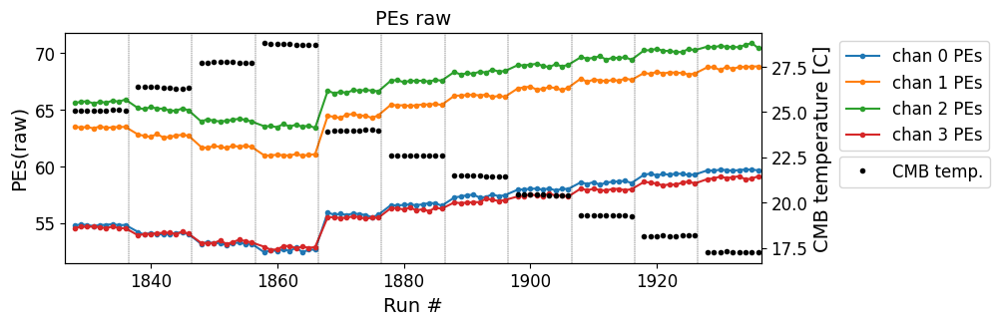

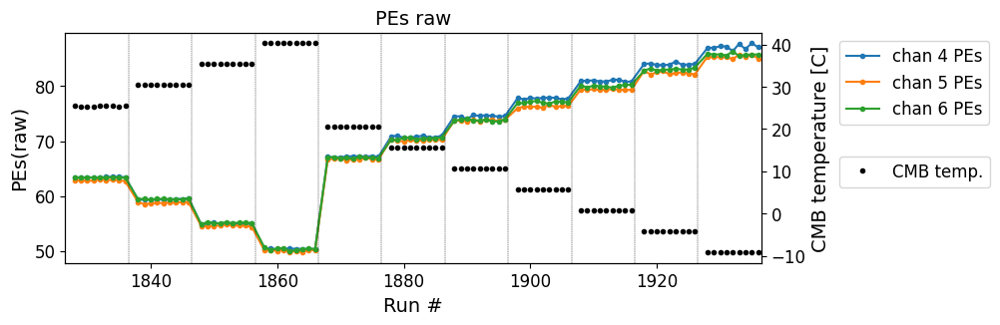

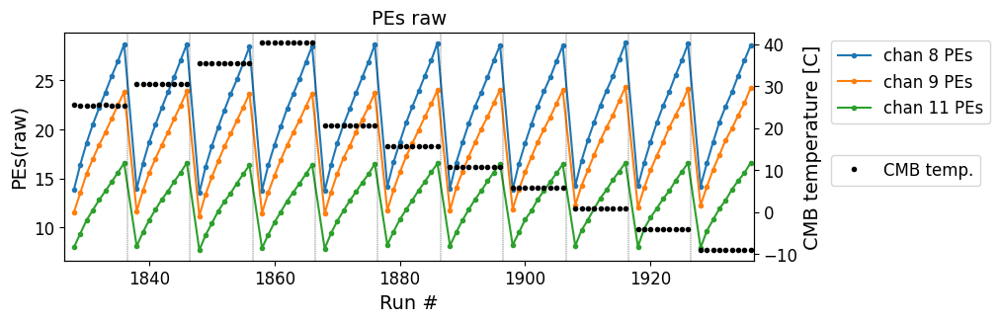

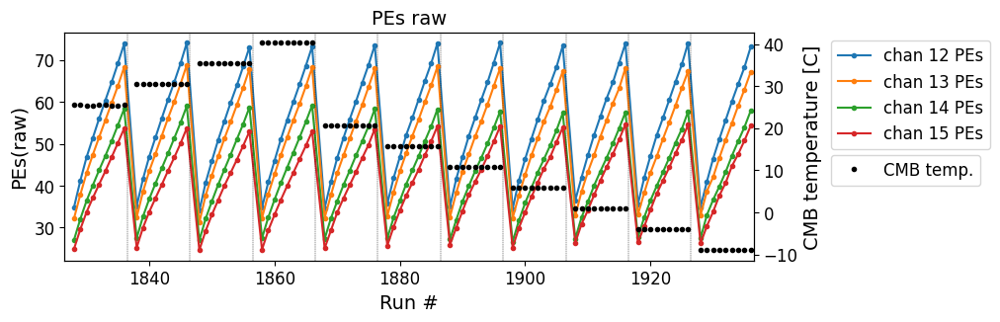

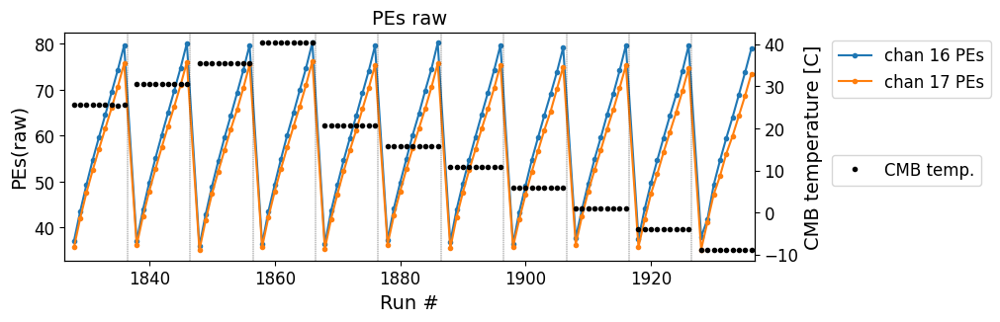

...

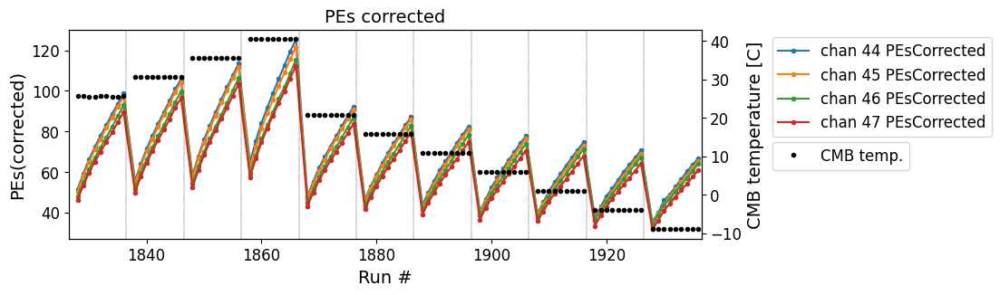

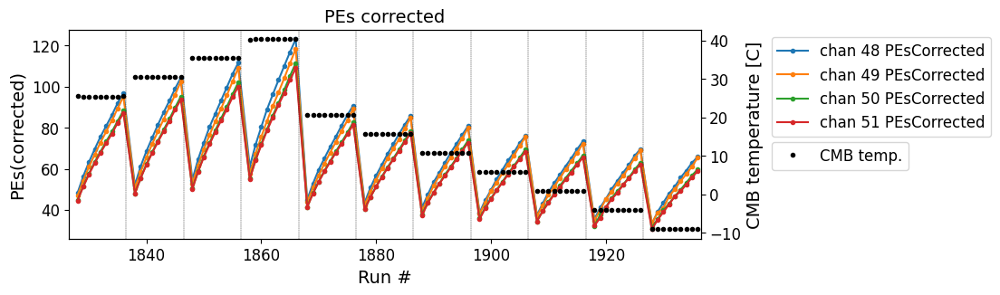

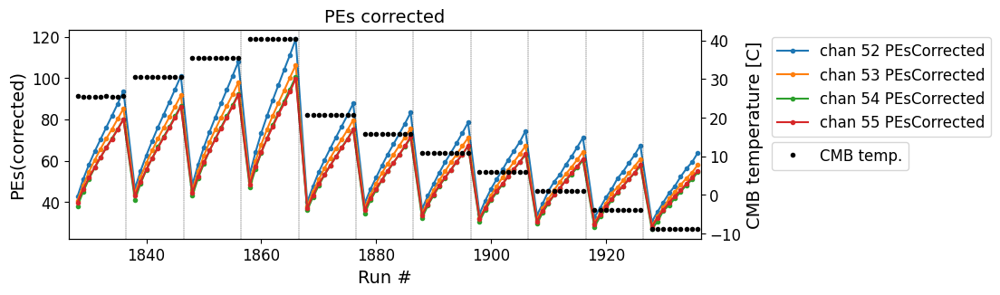

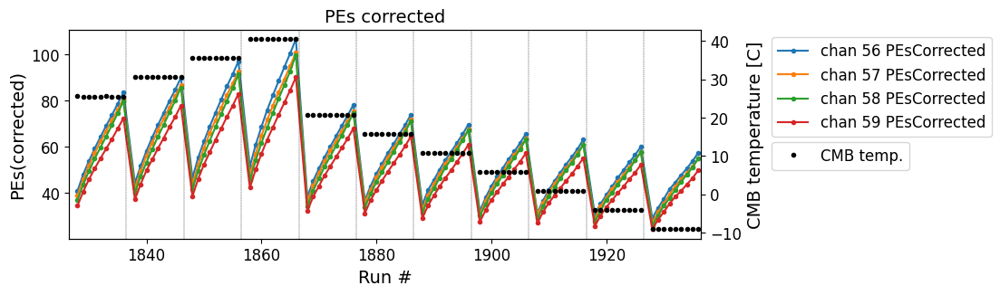

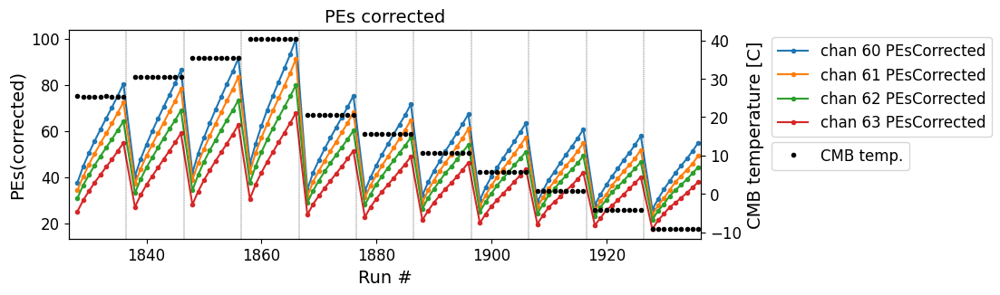

In [2]:
tempSensors = df['tempSensor'].unique()
tempSensors = np.sort(tempSensors)
FEBs = df['FEB'].unique()
FEBs = np.sort(FEBs)
runs = df['run'].unique()
runs = np.sort(runs)

bad_channels = [ 7, 10, 18, 19, 37]

# raw PEs
for chan_start in range(0, 64, 4):
    plt.figure(figsize = (9,3))
    for chan in range(chan_start, chan_start+4):
        if chan in bad_channels:
            continue
        df_ = df.query('ch == %i'%chan).reset_index(drop=True)
        plt.plot(df_['run'], df_['PEs'],'.-',
                 label='chan %i PEs'%chan)
    plt.title("PEs raw")
    plt.xlabel("Run #")
    plt.ylabel("PEs(raw)")
    plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
    plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
    ax2 = plt.gca().twinx()
    ax2.plot(df_['run'], df_['CMBtemp'],'.', color='k', linestyle='none', label='CMB temp.')
    ax2.set_ylabel("CMB temperature [C]")
    plt.legend(loc='upper left', bbox_to_anchor=(1.10, 0.5))
    for iTemp in range(11):
        plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
    plt.show()

# corrected PEs
for chan_start in range(0, 64, 4):
    plt.figure(figsize = (9,3))
    for chan in range(chan_start, chan_start+4):
        if chan in bad_channels:
            continue
        df_ = df.query('ch == %i'%chan).reset_index(drop=True)
        plt.plot(df_['run'], df_['PEsCorrected'],'.-',
                 label='chan %i PEsCorrected'%chan)
    plt.title("PEs corrected")
    plt.xlabel("Run #")
    plt.ylabel("PEs(corrected)")
    plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
    plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
    ax2 = plt.gca().twinx()
    ax2.plot(df_['run'], df_['CMBtemp'],'.', color='k', linestyle='none', label='CMB temp.')
    ax2.set_ylabel("CMB temperature [C]")
    plt.legend(loc='upper left', bbox_to_anchor=(1.10, 0.5))
    for iTemp in range(11):
        plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
    plt.show()

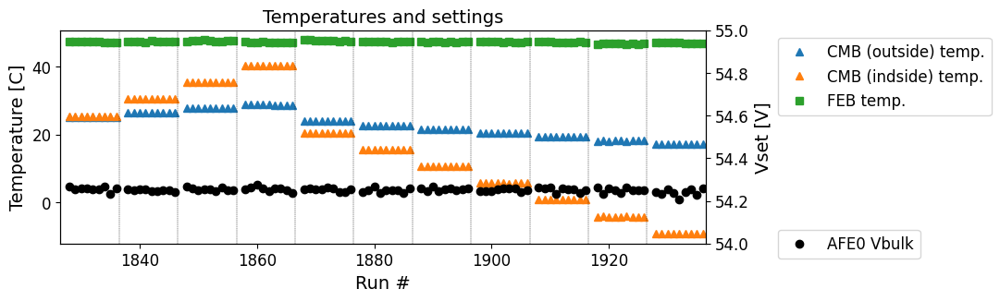

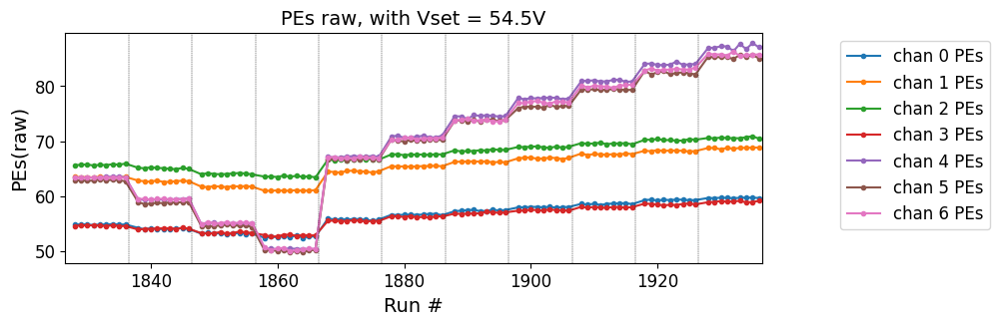

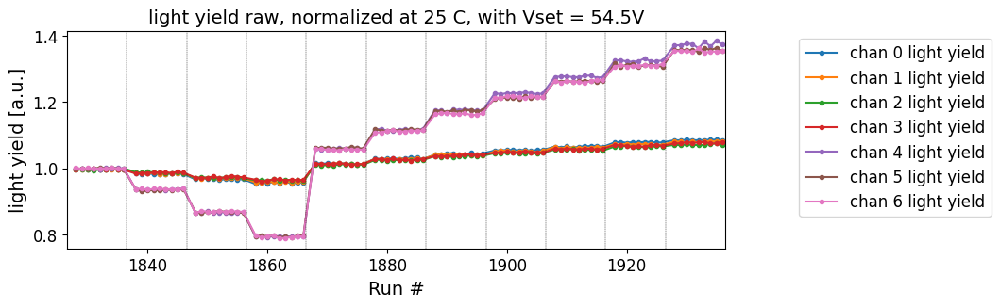

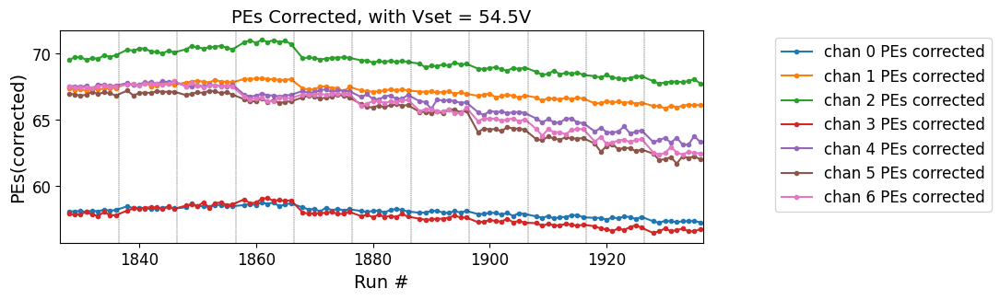

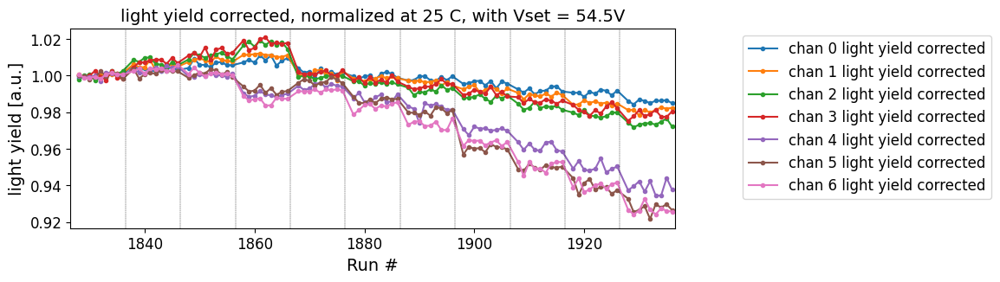

In [3]:
plt.figure(figsize = (9,3))
plt.title("Temperatures and settings")
df_ = df.query('ch == 0').reset_index(drop=True)
plt.plot(df_['run'], df_['CMBtemp'],'^', linestyle='none', label='CMB (outside) temp.')
df_ = df.query('ch == 4').reset_index(drop=True)
plt.plot(df_['run'], df_['CMBtemp'],'^', linestyle='none', label='CMB (indside) temp.')
plt.plot(df_['run'], df_['FEBtemp'],'s', linestyle='none', label='FEB temp.')
plt.xlabel("Run #")
plt.ylabel("Temperature [C]")
plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
ax2 = plt.gca().twinx()
ax2.plot(df_['run'], df_['biasV'],'o', color='k', linestyle='none', label='AFE0 Vbulk')
ax2.set_ylabel("Vset [V]")
ax2.set_ylim(54, 55)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 0.1))
for iTemp in range(11):
    plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
plt.show()

plt.figure(figsize = (9,3))
for chan in range(8):
    if chan in bad_channels:
        continue
    df_ = df.query('ch == %i'%chan).reset_index(drop=True)
    plt.plot(df_['run'], df_['PEs'],'.-',
             label='chan %i PEs'%chan)
plt.title("PEs raw, with Vset = 54.5V")
plt.xlabel("Run #")
plt.ylabel("PEs(raw)")
plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
for iTemp in range(11):
    plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
plt.show()

plt.figure(figsize = (9,3))
for chan in range(8):
    if chan in bad_channels:
        continue
    df_ = df.query('ch == %i'%chan).reset_index(drop=True)
    norm_factor =  np.mean(df_.query('CMBtemp > 24 and CMBtemp < 26').reset_index(drop=True)['PEs'])
    plt.plot(df_['run'], df_['PEs']/norm_factor,'.-',
             label='chan %i light yield'%chan)
plt.title("light yield raw, normalized at 25 C, with Vset = 54.5V")
plt.xlabel("Run #")
plt.ylabel("light yield [a.u.]")
plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
for iTemp in range(11):
    plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
plt.show()

plt.figure(figsize = (9,3))
for chan in range(8):
    if chan in bad_channels:
        continue
    df_ = df.query('ch == %i'%chan).reset_index(drop=True)
    plt.plot(df_['run'], df_['PEsCorrected'],'.-',
             label='chan %i PEs corrected'%chan)
plt.title("PEs Corrected, with Vset = 54.5V")
plt.xlabel("Run #")
plt.ylabel("PEs(corrected)")
plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
for iTemp in range(11):
    plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
plt.show()

plt.figure(figsize = (9,3))
for chan in range(8):
    if chan in bad_channels:
        continue
    df_ = df.query('ch == %i'%chan).reset_index(drop=True)
    norm_factor =  np.mean(df_.query('CMBtemp > 24 and CMBtemp < 26').reset_index(drop=True)['PEsCorrected'])
    plt.plot(df_['run'], df_['PEsCorrected']/norm_factor,'.-',
             label='chan %i light yield corrected'%chan)
plt.title("light yield corrected, normalized at 25 C, with Vset = 54.5V")
plt.xlabel("Run #")
plt.ylabel("light yield [a.u.]")
plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
for iTemp in range(11):
    plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
plt.show()

## Ideally, the normalized, corrected light yield from the channels should agree, which reflects LED light yield variance due to temperature. From the plot above, the agreement was not totally great.

In [4]:
df_008_PE = pd.DataFrame(columns=['chan', 'tempSensor', 'pe_54V_fix', 'pe_54V_fix_adj'])

for chan in range(64):
    if chan in bad_channels or chan<8:
        continue
    for tTemp in tempSensors:
        df_ = df.query("ch==%i & tempSensor==%f"%(chan, tTemp)).reset_index()
        xx = df_['VppN'].astype(float)
        yy = df_['PEs'].astype(float)
        zz = df_['PEsCorrected'].astype(float)
        mask = ~np.isnan(yy) & (yy>1)        
        mask1 = zz>1
        xx1=xx[mask1]
        xx=xx[mask]
        yy=yy[mask]
        zz=zz[mask1]
        if yy.size==0 :
            print("Bad channel: %d at set temp %.0f C"%(chan, tTemp))
            continue

        popt, pcov = curve_fit(lin_func, xx.astype(float), yy.astype(float))
        slope = popt[0]
        intercept = popt[1]
        std_err = np.sqrt(pcov[0,0])
        intercept_stderr = np.sqrt(pcov[1,1])
        
        popt1, pcov1 = curve_fit(lin_func, xx1.astype(float), zz.astype(float))
        slope1 = popt1[0]
        intercept1 = popt1[1]
        std_err1 = np.sqrt(pcov1[0,0])
        intercept_stderr1 = np.sqrt(pcov1[1,1])
        
        if slope == 0 or intercept == 0:
            print(chan, "slope:", slope, "intercept", intercept, "\n", xx, yy)

        new_row = {'chan':chan, 
                   'tempSensor':tTemp,
                   'pe_54V_fix': 54*slope+intercept,
                   'pe_54V_fix_adj': 54*slope1+intercept1}
        df_008_PE.loc[len(df_008_PE)] = new_row

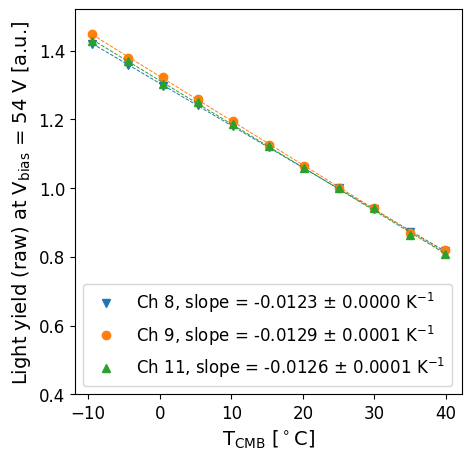

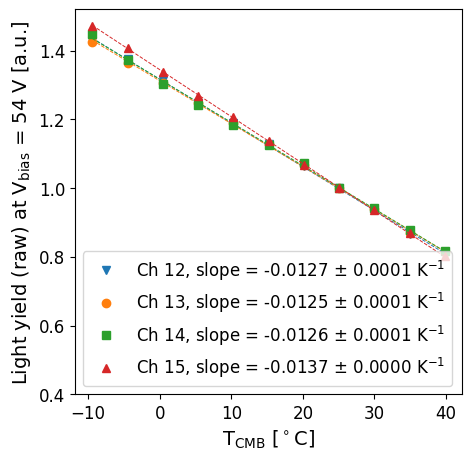

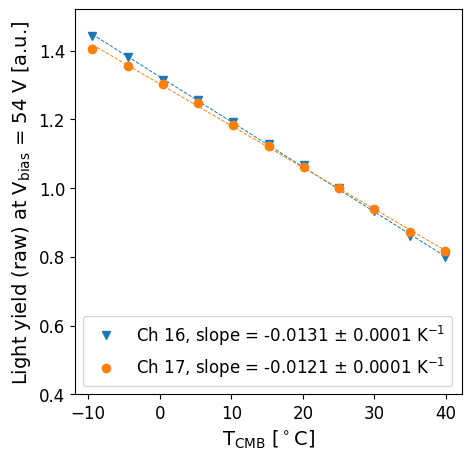

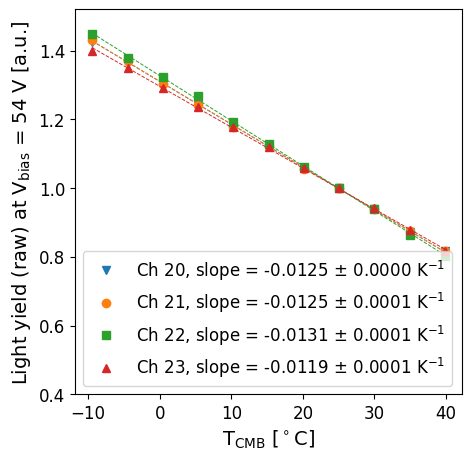

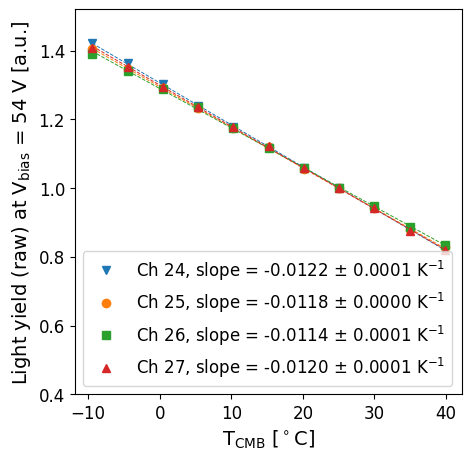

...

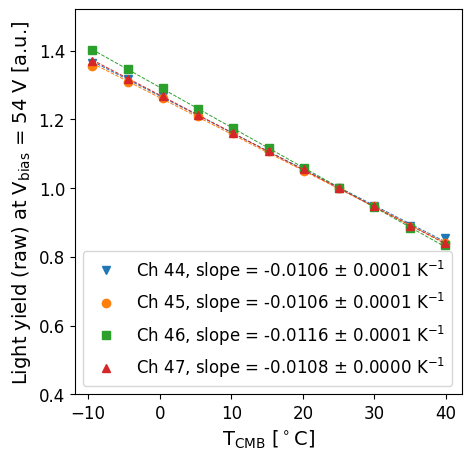

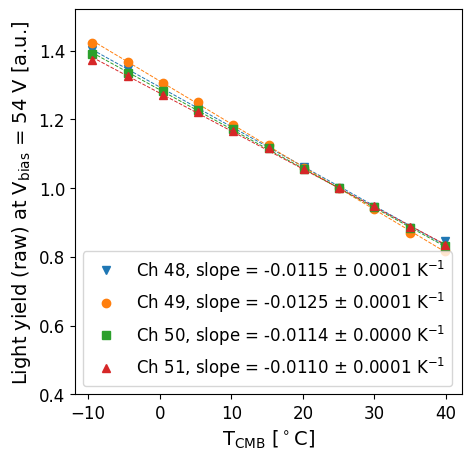

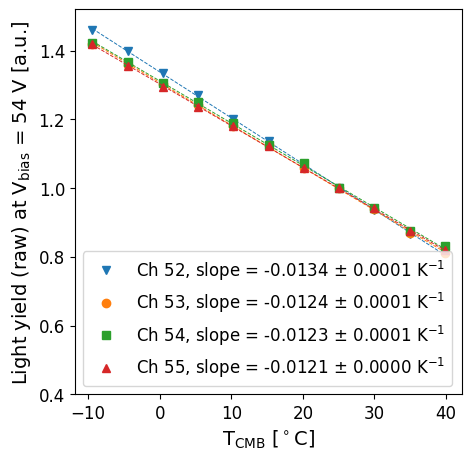

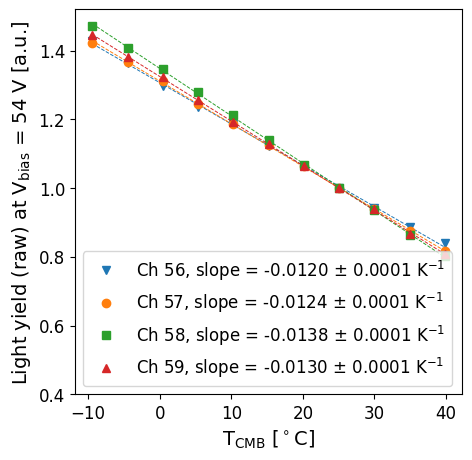

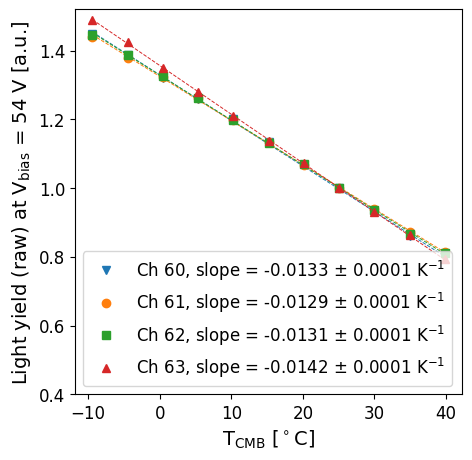

In [5]:
slope_list = []

for i in range(16):
    if i<2:
        continue
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
    ax.set_ylabel('Light yield (raw) at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
    start_chan = 4*i
    for chan in range(4):
        if chan+start_chan in bad_channels:
            continue
        df_ = df_008_PE.query("chan==%i"%(chan+start_chan)).reset_index()
        x = df_['tempSensor']
        y = df_['pe_54V_fix'].to_numpy()
        y = y/y[7]
        # print(chan+start_chan, y)
                   
        mask1 = ~np.isnan(y)
        mask2 = (y!=0)
        mask = mask1 & mask2
        x=x[mask]
        y=y[mask]
    
        popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
        slope = popt[0]
        intercept = popt[1]
        std_err = np.sqrt(pcov[0,0])
        intercept_stderr = np.sqrt(pcov[1,1])

        if chan+start_chan >= 8:
            slope_list.append(slope)
        
        scatter = ax.plot(x, y, markers[chan], label='Ch %i, slope = %.4f $\pm$ %.4f K$^{-1}$'%(chan+start_chan, slope, std_err))
        ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
        ax.set_ylim([0.4, 1.52])
        ax.legend()

Text(0, 0.5, 'Count')

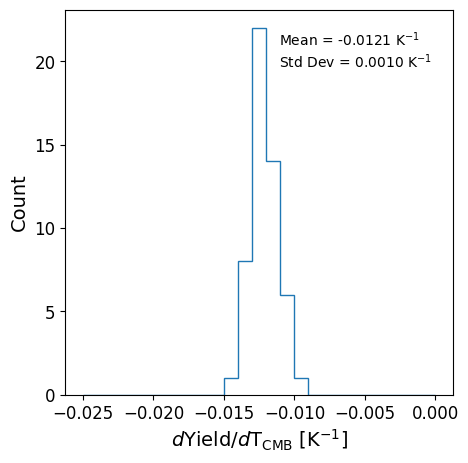

In [6]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.hist(slope_list, bins=[-0.025+0.001*i for i in range(26)], histtype='step')
ax.text(0.55, 0.85, 'Mean = %.4f K$^{-1}$'%(np.mean(slope_list))+'\n'+'Std Dev = %.4f K$^{-1}$'%(np.std(slope_list)), fontsize = 10, transform=ax.transAxes)
ax.set_xlabel('$d$Yield/$d$T$_{\mathrm{CMB}}$ [K$^{-1}$]')
ax.set_ylabel('Count')

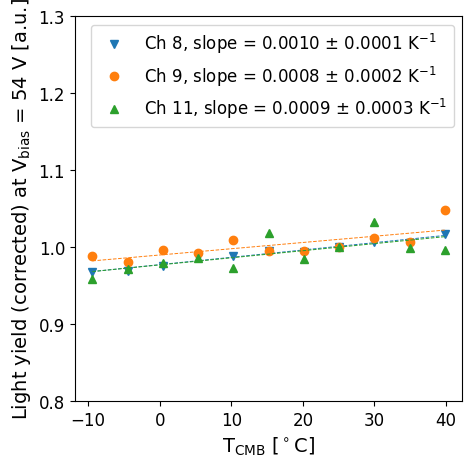

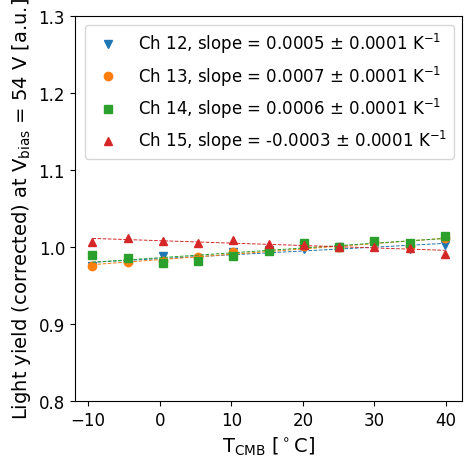

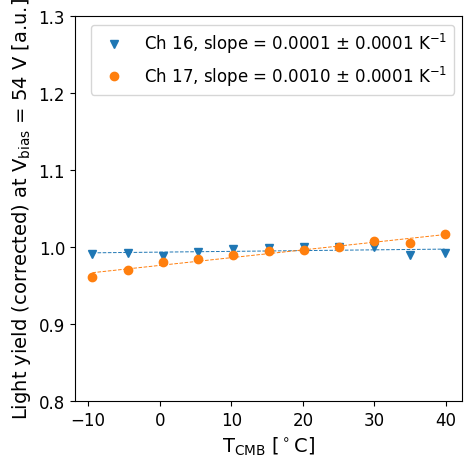

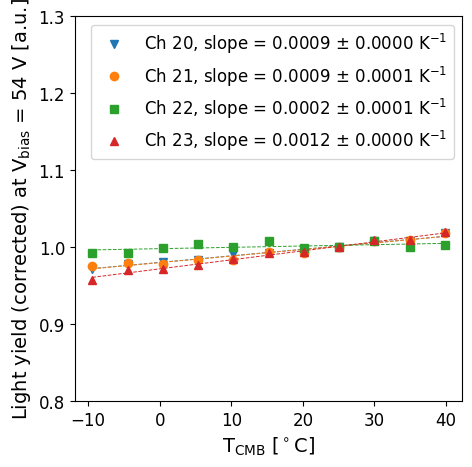

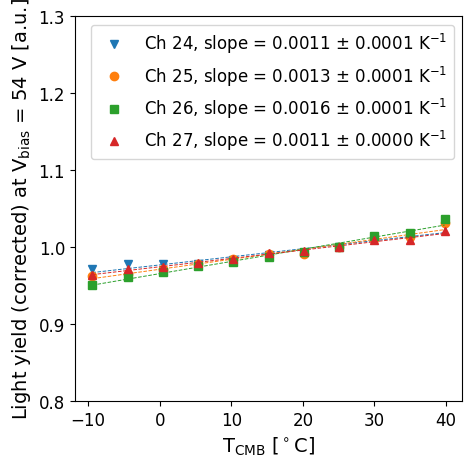

...

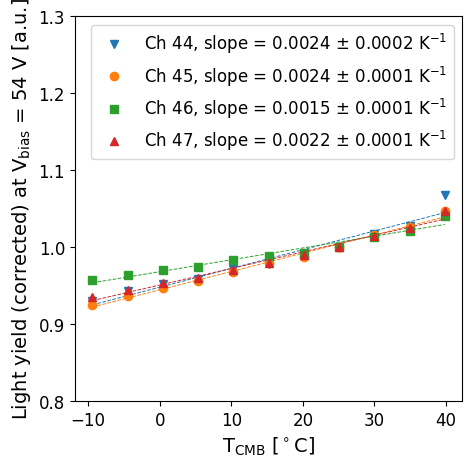

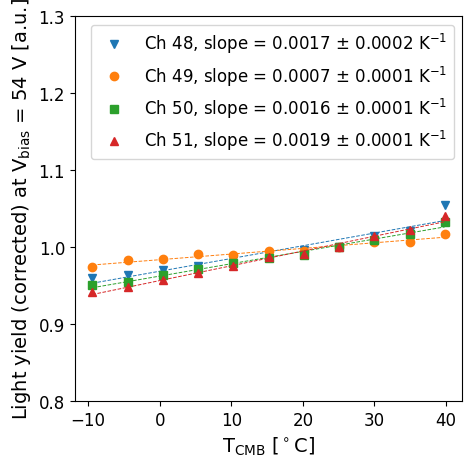

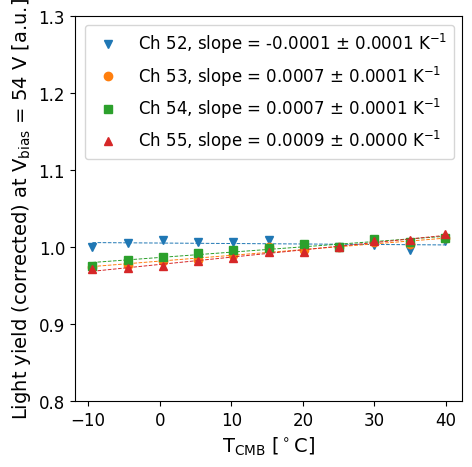

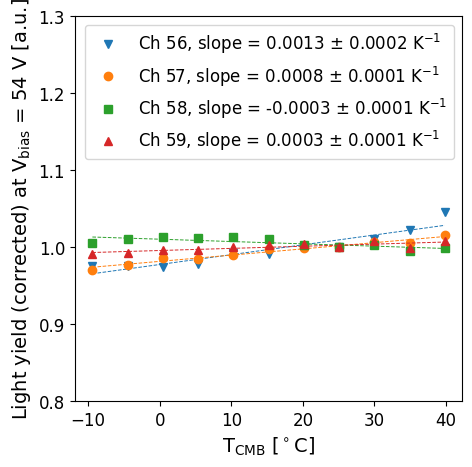

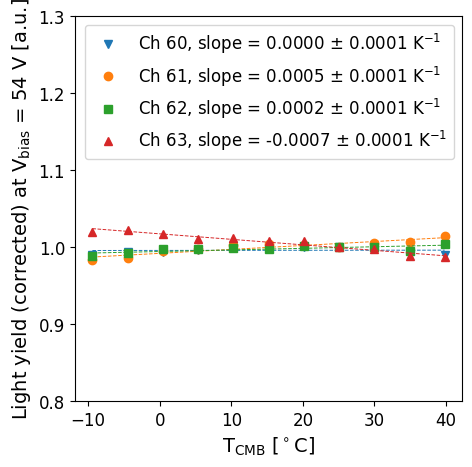

In [7]:
slope_list = []

for i in range(16):
    if i<2:
        continue
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
    ax.set_ylabel('Light yield (corrected) at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
    start_chan = 4*i
    for chan in range(4):
        if chan+start_chan in bad_channels:
            continue
        df_ = df_008_PE.query("chan==%i"%(chan+start_chan)).reset_index()
        x = df_['tempSensor']
        y = df_['pe_54V_fix_adj'].to_numpy()
        y = y/y[7]
        # print(chan+start_chan, y)
                   
        mask1 = ~np.isnan(y)
        mask2 = (y!=0)
        mask = mask1 & mask2
        x=x[mask]
        y=y[mask]
    
        popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
        slope = popt[0]
        intercept = popt[1]
        std_err = np.sqrt(pcov[0,0])
        intercept_stderr = np.sqrt(pcov[1,1])
        
        if chan+start_chan >= 8:
            slope_list.append(slope)
        
        scatter = ax.plot(x, y, markers[chan], label='Ch %i, slope = %.4f $\pm$ %.4f K$^{-1}$'%(chan+start_chan, slope, std_err))
        ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
        ax.set_ylim([0.8, 1.3])
        ax.legend()

Text(0, 0.5, 'Count')

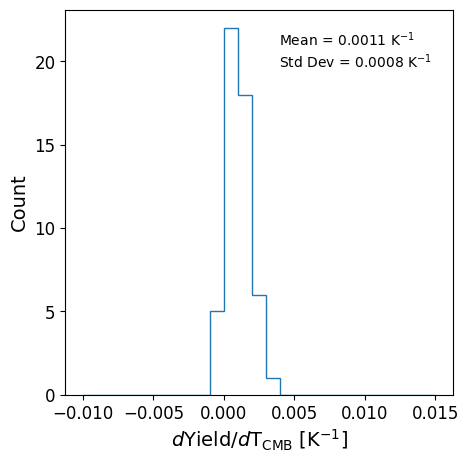

In [8]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.hist(slope_list, bins=[-0.010+0.001*i for i in range(26)], histtype='step')
ax.text(0.55, 0.85, 'Mean = %.4f K$^{-1}$'%(np.mean(slope_list))+'\n'+'Std Dev = %.4f K$^{-1}$'%(np.std(slope_list)), fontsize = 10, transform=ax.transAxes)
ax.set_xlabel('$d$Yield/$d$T$_{\mathrm{CMB}}$ [K$^{-1}$]')
ax.set_ylabel('Count')

## A slightly updated analysis uses Channel 0-7 to linearly extrapolate the light yield readout to 25 degC, which represents the LED light yields. 

25.075397 1.0 25.0 1.0
-0.0
25.0 1.0

26.346182 0.9887013 29.899999999999995 0.9366365
-0.014650377286855783
25.0 1.0084233562167322

27.759377 0.97358423 34.9 0.86826086
-0.014749884887937829
25.0 1.0142847208336998

28.738888 0.963837 39.8 0.79497033
-0.0152667010983775
25.0 1.0209175098321894

23.998726 1.0156868 20.1 1.059048
-0.011121917108696481
25.0 1.0045506627698653

22.625 1.0304625 15.199999999999998 1.1148304
-0.011362676267270685
25.0 1.0034761472984597

21.485252 1.0431032 10.3 1.1709901
-0.011433527560761965
25.0 1.0029172543004636

20.420303 1.0531079 5.3 1.2185024
-0.010938573177443846
25.0 1.0030125107099592

19.295832 1.0635097 0.4 1.2672286
-0.01078115555469061
25.0 1.0020121767176482

18.163504 1.0741946 -4.4 1.3153948
-0.01068983844171768
25.0 1.0011135089916618

17.272371 1.0815685 -9.4 1.3614069
-0.010491697184987974
25.0 1.0004925391768067



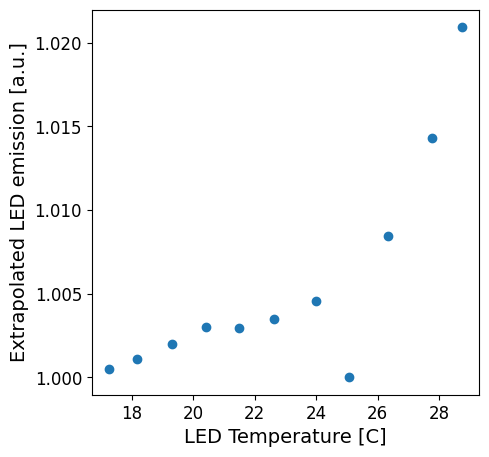

In [9]:
outsideT = []
outsideYield = []
insideT = []
insideYield = []

led_yield = []

ref = 25.

'''
item = df.query('ch == 0 or ch == 4').reset_index(drop=True)['CMBtemp']
for i in range(len(item)):
    print(item[i])
'''
# tie up light yields at 25 degC
for iTemp in range(11):
    run_num_low_lim = np.min(runs)+10*iTemp-1.5
    run_num_high_lim = run_num_low_lim+10

    mean_yield_list = []
    for chan in range(7):   
        norm_factor =  np.mean(df.query('ch == %i and run < %f'%(chan, np.min(runs)+10-1.5)).reset_index(drop=True)['PEs'])
        #norm_factor =  np.mean(df.query('ch == %i and CMBtemp > 24 and CMBtemp < 26'%(chan)).reset_index(drop=True)['PEs'])

        df_ = df.query('ch == %i and run > %f and run < %f'%(chan, run_num_low_lim, run_num_high_lim)).reset_index(drop=True)
        mean_yield_list.append(np.mean(df_['PEs'])/norm_factor)

    outsideYield.append(mean_yield_list[:4])
    insideYield.append(mean_yield_list[4:])
    df_ = df.query('ch == 0 and run > %f and run < %f'%(run_num_low_lim, run_num_high_lim)).reset_index(drop=True)
    outsideT.append(np.mean(df_['CMBtemp']))
    df_ = df.query('ch == 4 and run > %f and run < %f'%(run_num_low_lim, run_num_high_lim)).reset_index(drop=True)
    insideT.append(np.mean(df_['tempSensor']))

for iTemp in range(11):
    x1 = outsideT[iTemp]
    y1 = np.mean(outsideYield[iTemp])
    x2 = insideT[iTemp]
    y2 = np.mean(insideYield[iTemp])
    x = ref
    y = y1 + (y2-y1)/(x2-x1)*(x-x1)
    led_yield.append(y)

    print(x1, y1, x2, y2)
    print((y2-y1)/(x2-x1))
    print(ref, y)
    print()

fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlabel('LED Temperature [C]')
ax.set_ylabel('Extrapolated LED emission [a.u.]')
ax.plot(np.array(outsideT), np.array(led_yield), "o")

## linear interpolation doesn't lool good...

## Try to eqhalize LED light emission using channel overvoltage and the light yield - overvoltage relation, by adjusting the light yields to the same overvoltage

In [10]:
SPE_pklname = os.path.join(analysis_dir,"tempScanSiDetRun1SPE.pkl")
with open(SPE_pklname, 'rb') as f:
    df_SPE_clean = pickle.load(f)
    df_54V_Temp = pickle.load(f)
    df_55V_Temp = pickle.load(f)
    df_Vbd = pickle.load(f)

fixed_Vbias = 54.5 #V

def lightyield_Vover_cubic(x):
    a = 0.095
    b = 0.414
    c = -0.046
    d = 0.003
    return (a + b*x + c*x*x + d*x*x*x)

df_PE_monitor = pd.DataFrame(columns=['chan', 'tempCMB', 'tempLED', 'isInside',
                                      'yieldRaw', 'Vbd', 'Vover', 
                                      'yieldatVover3V', 'yieldatVover3V_normTLED25C'])
                                      
for chan in range(7):
    df_Vbd_ = df_Vbd.query('chan == %i'%(chan)).reset_index(drop=True)
    for iTemp in range(11):
        if chan < 4:
            isInside = False
            tempCMB = outsideT[iTemp]
            yieldRaw = outsideYield[iTemp][chan]
        else:
            isInside = True
            tempCMB = insideT[iTemp]
            yieldRaw = insideYield[iTemp][chan-4]
        tempLED = outsideT[iTemp]
        Vbd = df_Vbd_['slope'][0]*tempCMB/1000.+df_Vbd_['intercept'][0]
        Vover = fixed_Vbias - Vbd
        yieldatVover3V = yieldRaw/lightyield_Vover_cubic(Vover)*lightyield_Vover_cubic(3.0)
        # print(Vover, lightyield_Vover_cubic(Vover))
        if iTemp == 0:
            tNormFactor = yieldatVover3V
        yieldatVover3V_normTLED25C = yieldatVover3V/tNormFactor

        new_row = {'chan':chan, 
                   'tempCMB':tempCMB, 
                   'tempLED':tempLED, 
                   'isInside':isInside,
                   'yieldRaw':yieldRaw, 
                   'Vbd':Vbd, 
                   'Vover':Vover, 
                   'yieldatVover3V':yieldatVover3V, 
                   'yieldatVover3V_normTLED25C':yieldatVover3V_normTLED25C}
        df_PE_monitor.loc[len(df_PE_monitor)] = new_row

pd.set_option('display.max_rows', 100)
display(df_PE_monitor)

,chan,tempCMB,tempLED,isInside,yieldRaw,Vbd,Vover,yieldatVover3V,yieldatVover3V_normTLED25C
0,0,25.075397,25.075397,False,1.000000,51.425960,3.074040,0.984206,1.000000
1,0,26.346182,26.346182,False,0.986341,51.496975,3.003025,0.985691,1.001509
2,0,27.759377,27.759377,False,0.970326,51.575947,2.924053,0.986783,1.002618
3,0,28.738888,28.738888,False,0.959265,51.630685,2.869315,0.987748,1.003599
4,0,23.998726,23.998726,False,1.016945,51.365793,3.134207,0.988342,1.004202
5,0,22.625000,22.625000,False,1.032848,51.289026,3.210974,0.988178,1.004036
6,0,21.485252,21.485252,False,1.046680,51.225334,3.274666,0.988790,1.004658
7,0,20.420303,20.420303,False,1.057656,51.165822,3.334178,0.987641,1.003490
8,0,19.295832,19.295832,False,1.068402,51.102984,3.397016,0.985789,1.001608
9,0,18.163504,18.163504,False,1.081545,51.039706,3.460294,0.986195,1.002022


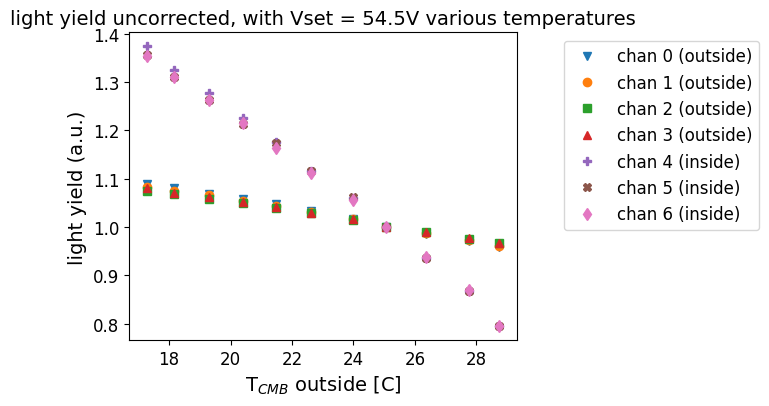

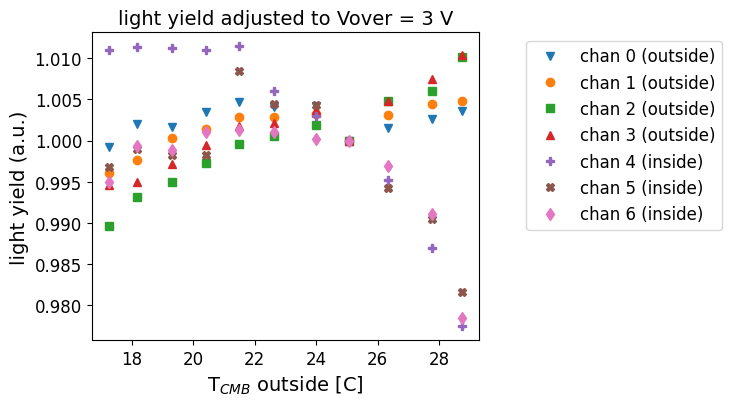

In [11]:
plt.figure(figsize = (5,4))
for chan in range(7):
    df_PE_monitor_ = df_PE_monitor.query('chan == %i'%chan).reset_index(drop=True)
    plt.plot(df_PE_monitor_['tempLED'], df_PE_monitor_['yieldRaw'],markers[chan],
             label='chan %i '%chan+('(inside)' if chan>=4 else '(outside)'))
plt.title("light yield uncorrected, with Vset = 54.5V various temperatures")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
plt.show()

plt.figure(figsize = (5,4))
for chan in range(7):
    df_PE_monitor_ = df_PE_monitor.query('chan == %i'%chan).reset_index(drop=True)
    plt.plot(df_PE_monitor_['tempLED'], df_PE_monitor_['yieldatVover3V_normTLED25C'],markers[chan],
             label='chan %i '%chan+('(inside)' if chan>=4 else '(outside)'))
plt.title("light yield adjusted to Vover = 3 V")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
plt.show()


## The region with large deviations are the region where Vover is ~2.5V and below, where the fit did not include and was extraplolating:
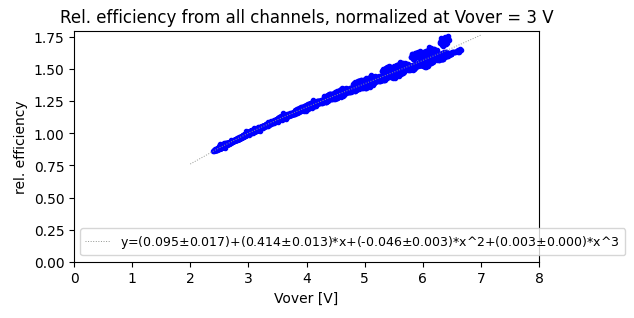
## Try to redo with the following input, that includes Vover ~2V datapoints, and improved normalization method:
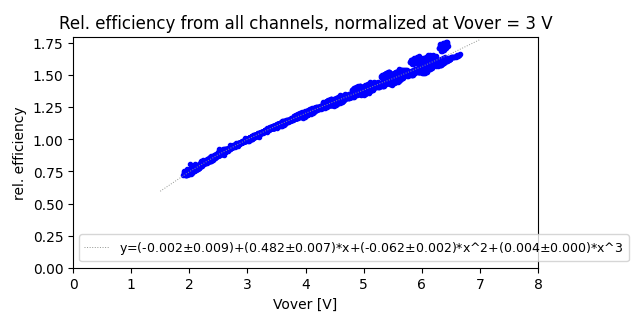 

In [12]:
SPE_pklname = os.path.join(analysis_dir,"tempScanSiDetRun1SPE.pkl")
with open(SPE_pklname, 'rb') as f:
    df_SPE_clean = pickle.load(f)
    df_54V_Temp = pickle.load(f)
    df_55V_Temp = pickle.load(f)
    df_Vbd = pickle.load(f)

fixed_Vbias = 54.5 #V

def lightyield_Vover_cubic(x):
    a = 0.002
    b = 0.482
    c = -0.062
    d = 0.004
    return (a + b*x + c*x*x + d*x*x*x)

df_PE_monitor = pd.DataFrame(columns=['chan', 'tempCMB', 'tempLED', 'isInside',
                                      'yieldRaw', 'Vbd', 'Vover', 
                                      'yieldatVover3V', 'yieldatVover3V_normTLED25C'])
                                      
for chan in range(7):
    df_Vbd_ = df_Vbd.query('chan == %i'%(chan)).reset_index(drop=True)
    for iTemp in range(11):
        if chan < 4:
            isInside = False
            tempCMB = outsideT[iTemp]
            yieldRaw = outsideYield[iTemp][chan]
        else:
            isInside = True
            tempCMB = insideT[iTemp]
            yieldRaw = insideYield[iTemp][chan-4]
        tempLED = outsideT[iTemp]
        Vbd = df_Vbd_['slope'][0]*tempCMB/1000.+df_Vbd_['intercept'][0]
        Vover = fixed_Vbias - Vbd
        yieldatVover3V = yieldRaw/lightyield_Vover_cubic(Vover)*lightyield_Vover_cubic(3.0)
        # print(Vover, lightyield_Vover_cubic(Vover))
        if iTemp == 0:
            tNormFactor = yieldatVover3V
        yieldatVover3V_normTLED25C = yieldatVover3V/tNormFactor

        new_row = {'chan':chan, 
                   'tempCMB':tempCMB, 
                   'tempLED':tempLED, 
                   'isInside':isInside,
                   'yieldRaw':yieldRaw, 
                   'Vbd':Vbd, 
                   'Vover':Vover, 
                   'yieldatVover3V':yieldatVover3V, 
                   'yieldatVover3V_normTLED25C':yieldatVover3V_normTLED25C}
        df_PE_monitor.loc[len(df_PE_monitor)] = new_row

pd.set_option('display.max_rows', 100)
display(df_PE_monitor)

,chan,tempCMB,tempLED,isInside,yieldRaw,Vbd,Vover,yieldatVover3V,yieldatVover3V_normTLED25C
0,0,25.075397,25.075397,False,1.000000,51.425960,3.074040,0.984221,1.000000
1,0,26.346182,26.346182,False,0.986341,51.496975,3.003025,0.985690,1.001492
2,0,27.759377,27.759377,False,0.970326,51.575947,2.924053,0.986848,1.002669
3,0,28.738888,28.738888,False,0.959265,51.630685,2.869315,0.987915,1.003753
4,0,23.998726,23.998726,False,1.016945,51.365793,3.134207,0.988423,1.004269
5,0,22.625000,22.625000,False,1.032848,51.289026,3.210974,0.988407,1.004253
6,0,21.485252,21.485252,False,1.046680,51.225334,3.274666,0.989194,1.005052
7,0,20.420303,20.420303,False,1.057656,51.165822,3.334178,0.988245,1.004088
8,0,19.295832,19.295832,False,1.068402,51.102984,3.397016,0.986641,1.002459
9,0,18.163504,18.163504,False,1.081545,51.039706,3.460294,0.987337,1.003166


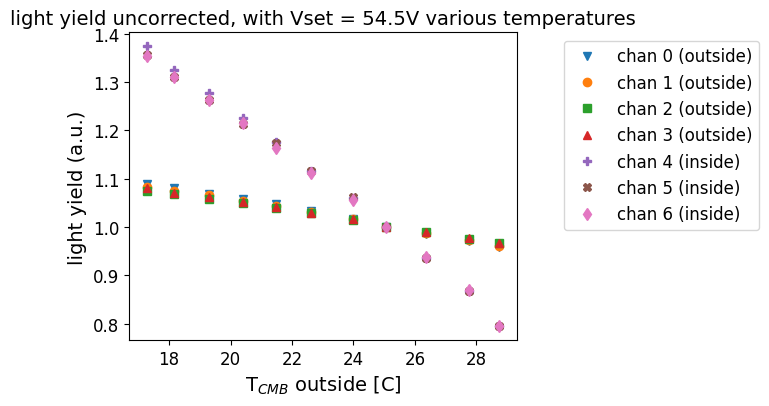

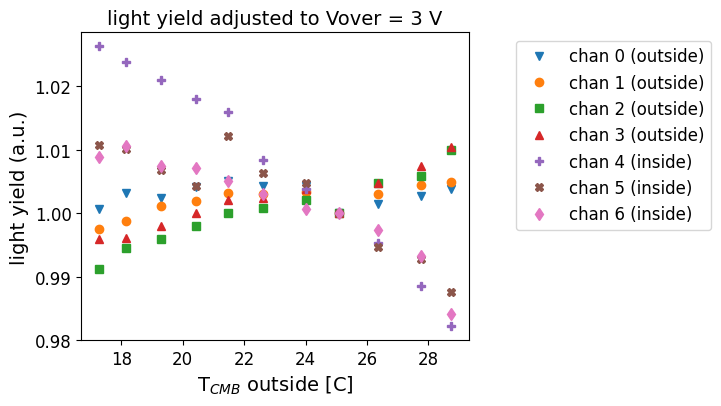

In [13]:
plt.figure(figsize = (5,4))
for chan in range(7):
    df_PE_monitor_ = df_PE_monitor.query('chan == %i'%chan).reset_index(drop=True)
    plt.plot(df_PE_monitor_['tempLED'], df_PE_monitor_['yieldRaw'],markers[chan],
             label='chan %i '%chan+('(inside)' if chan>=4 else '(outside)'))
plt.title("light yield uncorrected, with Vset = 54.5V various temperatures")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
plt.show()

plt.figure(figsize = (5,4))
for chan in range(7):
    df_PE_monitor_ = df_PE_monitor.query('chan == %i'%chan).reset_index(drop=True)
    plt.plot(df_PE_monitor_['tempLED'], df_PE_monitor_['yieldatVover3V_normTLED25C'],markers[chan],
             label='chan %i '%chan+('(inside)' if chan>=4 else '(outside)'))
plt.title("light yield adjusted to Vover = 3 V")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
plt.show()


## Noticing the light yield - Vover correction curves used were the average of the channels. As Channel 0-3 have small range of temperatures, the corrections are small. Channel 4-6 need to correct over a range of 50 degC, which is more vulnerable to channe-to-channel differences. However, the fact that after correction, the differences are <2% (from ~50%) is a good testimony of the correction method.

## To play with this concept, here will use the other channels and look at the different light yields under different temperature settings but all at Vover = 3. The tiny difference should reflect on the LED light emmission. 

In [14]:
SPE_pklname = os.path.join(analysis_dir,"tempScanSiDetRun2SPE.pkl")
with open(SPE_pklname, 'rb') as f:
    df_SPE_clean = pickle.load(f)
    df_54V_Temp = pickle.load(f)
    df_55V_Temp = pickle.load(f)
    df_Vbd = pickle.load(f)

Vover = []
df_scan = df.query("ch >= 8").reset_index(drop=True)
for index, row in df_scan.iterrows():
    if row['ch'] in bad_channels:
        Vover.append(0)
    else:
        tChan = row['ch']
        df_Vbd_ = df_Vbd.query("chan == %i"%tChan).reset_index()
        VbdPerC = df_Vbd_['slope'][0]/1000.
        VbdIntercept = df_Vbd_['intercept'][0]
        tTemp = row['CMBtemp']
        tVppN = row['VppN']
        Vover.append(tVppN - (VbdPerC*tTemp+VbdIntercept))
df_scan.loc[:, 'Vover'] = np.array(Vover)


In [15]:
normalization_Vover = 3
df_normalizationAt3VVover = pd.DataFrame(columns=['ch', 'tempSetup', 'PEsat3V'])
tempSetups = df['tempSetup'].unique()
tempSetups = np.sort(tempSetups)

for index in range(64-8):
    chan = index + 8
    if chan in bad_channels:
        continue
    for tTempSetup in tempSetups:
        df_ = df_scan.query("ch==%i and tempSetup==%f"%(chan, tTempSetup)).reset_index()
        xx = df_['Vover'].astype(float)
        yy = df_['PEs'].astype(float)
        mask = (yy>0)
        xx=xx[mask]
        yy=yy[mask]
        if yy.size==0:
            print("0PE channel: %d at set temp %.0f C"%(chan, tTempSetup))
            continue            
        if xx.size>5 and np.min(xx)<=3 and np.max(xx)>=3.5:
            popt, pcov = curve_fit(func_cubic, xx.astype(float), yy.astype(float))
            tNormalization = popt[0]*3*3*3 + popt[1]*3*3 + popt[2]*3 + popt[3]
            #popt, pcov = curve_fit(lin_func, xx.astype(float), yy.astype(float))
            #tNormalization = popt[0]*3 + popt[1]
            new_row = {'ch':chan, 
                       'tempSetup':tTempSetup, 
                       'PEsat3V':tNormalization}
            df_normalizationAt3VVover.loc[len(df_normalizationAt3VVover)] = new_row            
        else:
            print("Cannot interpolate channel %d at set temp %.0f C"%(chan, tTempSetup))
            print(list(xx))
            new_row = {'ch':chan, 
                       'tempSetup':tTempSetup, 
                       'PEsat3V':0.0}
            df_normalizationAt3VVover.loc[len(df_normalizationAt3VVover)] = new_row      

display(df_normalizationAt3VVover)

,ch,tempSetup,PEsat3V
0,8,-10.0,18.310649
1,8,-5.0,18.220565
2,8,0.0,18.290622
3,8,5.0,18.298220
4,8,10.0,18.276924
...,...,...,...
567,63,20.0,32.165816
568,63,25.0,31.908398
569,63,30.0,31.888641
570,63,35.0,31.851534


In [16]:
tempLEDs = df_PE_monitor['tempLED'].unique()
tempLEDs = np.sort(tempLEDs)

PEsat3V_normalized_column = []
tempLED_column = []
for index, row in df_normalizationAt3VVover.iterrows():
    tChan = row['ch']
    norm_factor = df_normalizationAt3VVover.query("ch ==%iand tempSetup==25.0"%tChan).reset_index()['PEsat3V']
    PEsat3V_normalized_column.append(row['PEsat3V']/norm_factor)
    tempLED_column.append(tempLEDs[np.where(tempSetups==row['tempSetup'])])
df_normalizationAt3VVover.loc[:, 'PEsat3V_normalized'] = np.array(PEsat3V_normalized_column)
df_normalizationAt3VVover.loc[:, 'tempLED'] = np.array(tempLED_column)

display(df_normalizationAt3VVover)

,ch,tempSetup,PEsat3V,PEsat3V_normalized,tempLED
0,8,-10.0,18.310649,1.004845,17.272371
1,8,-5.0,18.220565,0.999902,18.163504
2,8,0.0,18.290622,1.003746,19.295832
3,8,5.0,18.298220,1.004163,20.420303
4,8,10.0,18.276924,1.002994,21.485252
...,...,...,...,...,...
567,63,20.0,32.165816,1.008067,23.998726
568,63,25.0,31.908398,1.000000,25.075397
569,63,30.0,31.888641,0.999381,26.346182
570,63,35.0,31.851534,0.998218,27.759377


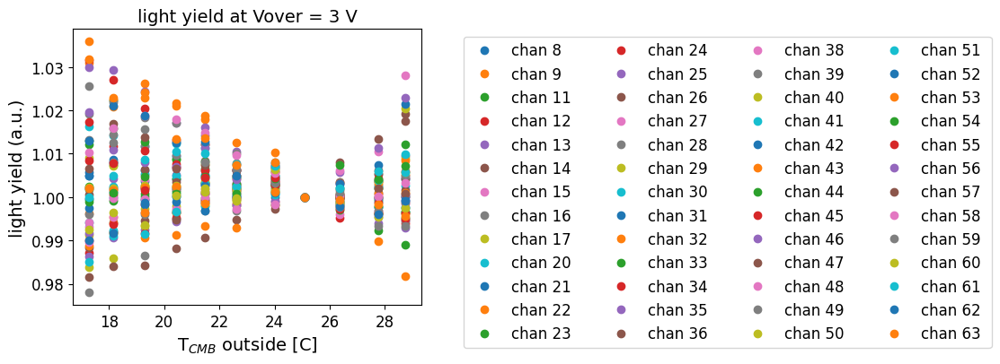

In [17]:
plt.figure(figsize = (5,4))
allchs = df_normalizationAt3VVover['ch'].unique()
for chan in allchs:
    df_normalizationAt3VVover_ = df_normalizationAt3VVover.query('ch == %i'%chan).reset_index(drop=True)
    plt.plot(df_normalizationAt3VVover_['tempLED'], df_normalizationAt3VVover_['PEsat3V_normalized'],
             'o', label='chan %i '%chan)
plt.title("light yield at Vover = 3 V")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', ncol = 4, bbox_to_anchor=(1.10, 1.0))
plt.show()

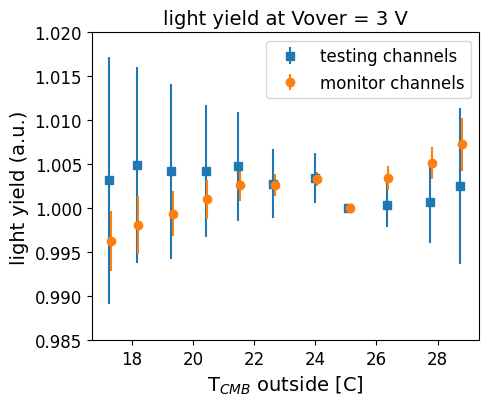

In [18]:
plt.figure(figsize = (5,4))
df_PE_monitor_ = df_PE_monitor.query('chan < 4').reset_index(drop=True)
lightYield = []
lightYieldRms = []
lightYield_monitor = []
lightYieldRms_monitor = []
for tTempLED in tempLEDs:
    df_normalizationAt3VVover_ = df_normalizationAt3VVover.query('tempLED == %f'%tTempLED).reset_index(drop=True)
    lightYield.append(np.mean(df_normalizationAt3VVover_['PEsat3V_normalized'].astype(float)))
    lightYieldRms.append(np.std(df_normalizationAt3VVover_['PEsat3V_normalized'].astype(float)))
    df_PE_monitor__ = df_PE_monitor_.query('tempLED == %f'%tTempLED).reset_index(drop=True)
    lightYield_monitor.append(np.mean(df_PE_monitor__['yieldatVover3V_normTLED25C'].astype(float)))
    lightYieldRms_monitor.append(np.std(df_PE_monitor__['yieldatVover3V_normTLED25C'].astype(float)))
plt.errorbar(tempLEDs, np.array(lightYield), np.array(lightYieldRms), marker='s', linestyle='none', label = 'testing channels')
plt.errorbar(tempLEDs+0.05, np.array(lightYield_monitor), np.array(lightYieldRms_monitor), marker='o', linestyle='none', label = 'monitor channels')
plt.title("light yield at Vover = 3 V")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend()
plt.gca().set_ylim(0.985, 1.020)
plt.show()

## The ones coming from the test channels did not correct for run-to-run light yield variation at the same temperature, and fitting light yield - Vover correction for each temperature alone may not be very stable. Try to use the template specific for the channel?

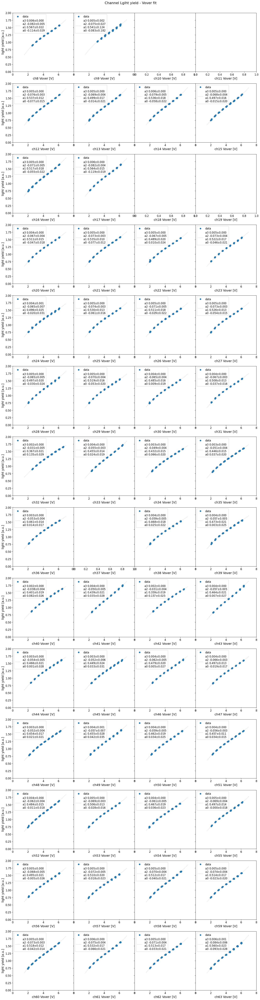

In [19]:
temppklname = os.path.join(analysis_dir,"tempScanSiDetRun2PE_yiled_Vover_templates.pkl")
with open(temppklname, 'rb') as f:
    df_channel_template = pickle.load(f)
df_channel_fit = pd.DataFrame(columns=['chan', 
                                       'a3', 'a3_err', 
                                       'a2', 'a2_err', 
                                       'a1', 'a1_err', 
                                       'a0', 'a0_err'])
fig, axs = plt.subplots(nrows = 14, ncols = 4, figsize = (5*4, 5*14/0.97), sharey = True)
plt.suptitle("Channel Lgiht yield - Vover fit")
plt.subplots_adjust(wspace=0)
fig.subplots_adjust(top=0.97)
ytitle = 'light yield [a.u.]'
xtitle = 'Vover [V]'
for index, ax in enumerate(axs.flatten()):
    chan = index + 8
    ax.set_xlabel('ch%i '%chan+xtitle)
    if (index%4 == 0):
        ax.set_ylabel(ytitle)
    if chan in bad_channels or chan == 11:
        continue
    df_ = df_channel_template.query("chan==%i"%(chan)).reset_index(drop=True)  
    xx = df_['Vover'].astype(float)
    yy = df_['yieldNormalized'].astype(float)
    
    popt, pcov = curve_fit(func_cubic, xx, yy)
    a3 = popt[0]
    a3_err = np.sqrt(pcov[0,0])
    a2 = popt[1]
    a2_err = np.sqrt(pcov[1,1])
    a1 = popt[2]
    a1_err = np.sqrt(pcov[2,2])
    a0 = popt[3]
    a0_err = np.sqrt(pcov[3,3])
    def tfunc(x):
        return a3*x*x*x+a2*x*x+a1*x+a0
    
    tscatter = ax.plot(xx, yy, 'o', label='data')
    dotx = np.array([0.5*x for x in range(3, 15)])
    ax.plot(dotx, np.apply_along_axis(tfunc, 0, dotx), 
            ':', color = '#929591', linewidth=0.7, 
            label='a3 %.3f$\pm$%.3f \na2 %.3f$\pm$%.3f \na1 %.3f$\pm$%.3f \na0 %.3f$\pm$%.3f'%(a3, a3_err, a2, a2_err, a1, a1_err, a0, a0_err))

    ax.set_xlim(0.,8.)
    ax.set_ylim(0.,2.)
    ax.legend()
            
    new_row = {'chan':chan,
               'a3':a3, 'a3_err':a3_err, 
               'a2':a2, 'a2_err':a2_err, 
               'a1':a1, 'a1_err':a1_err, 
               'a0':a0, 'a0_err':a0_err}
    df_channel_fit.loc[len(df_channel_fit)] = new_row

plt.show()

In [20]:
normalization_Vover = 3
df_normalizationAt3VVover_templated = pd.DataFrame(columns=['ch', 'tempSetup', 'PEsat3V'])

for index in range(64-8):
    chan = index + 8
    if chan in bad_channels or chan == 11:
        continue
        
    df_channel_fit_ = df_channel_fit.query("chan==%i"%chan).reset_index()
    a3 = df_channel_fit_['a3'][0]
    a2 = df_channel_fit_['a2'][0]
    a1 = df_channel_fit_['a1'][0]
    a0 = df_channel_fit_['a0'][0]
    def this_cubic_template(x):
        return a3*x*x*x+a2*x*x+a1*x+a0
            
    for tTempSetup in tempSetups:
        df_ = df_scan.query("ch==%i and tempSetup==%f"%(chan, tTempSetup)).reset_index()
        xx = df_['Vover'].astype(float)
        yy = df_['PEs'].astype(float)
        mask = (yy>0)
        xx=xx[mask]
        yy=yy[mask]
        if yy.size==0:
            print("0PE channel: %d at set temp %.0f C"%(chan, tTempSetup))
            continue            
        if xx.size>5 and np.min(xx)<=3 and np.max(xx)>=3.5:
            def tfunc(x, k):
                return k*this_cubic_template(x)
            popt, pcov = curve_fit(tfunc, xx.astype(float), yy.astype(float))
            tNormalization = tfunc(3.0, popt[0])
            new_row = {'ch':chan, 
                       'tempSetup':tTempSetup, 
                       'PEsat3V':tNormalization}
            df_normalizationAt3VVover_templated.loc[len(df_normalizationAt3VVover_templated)] = new_row            
        else:
            print("Cannot interpolate channel %d at set temp %.0f C"%(chan, tTempSetup))
            print(list(xx))
            new_row = {'ch':chan, 
                       'tempSetup':tTempSetup, 
                       'PEsat3V':0.0}
            df_normalizationAt3VVover_templated.loc[len(df_normalizationAt3VVover_templated)] = new_row      

display(df_normalizationAt3VVover_templated)

,ch,tempSetup,PEsat3V
0,8,-10.0,18.286423
1,8,-5.0,18.251227
2,8,0.0,18.237555
3,8,5.0,18.280486
4,8,10.0,18.248150
...,...,...,...
556,63,20.0,32.183930
557,63,25.0,32.056560
558,63,30.0,32.072142
559,63,35.0,31.983019


In [21]:
PEsat3V_normalized_column = []
tempLED_column = []
for index, row in df_normalizationAt3VVover_templated.iterrows():
    tChan = row['ch']
    norm_factor = df_normalizationAt3VVover_templated.query("ch ==%iand tempSetup==25.0"%tChan).reset_index()['PEsat3V']
    PEsat3V_normalized_column.append(row['PEsat3V']/norm_factor)
    tempLED_column.append(tempLEDs[np.where(tempSetups==row['tempSetup'])])
df_normalizationAt3VVover_templated.loc[:, 'PEsat3V_normalized'] = np.array(PEsat3V_normalized_column)
df_normalizationAt3VVover_templated.loc[:, 'tempLED'] = np.array(tempLED_column)

display(df_normalizationAt3VVover_templated)

,ch,tempSetup,PEsat3V,PEsat3V_normalized,tempLED
0,8,-10.0,18.286423,1.001486,17.272371
1,8,-5.0,18.251227,0.999559,18.163504
2,8,0.0,18.237555,0.998810,19.295832
3,8,5.0,18.280486,1.001161,20.420303
4,8,10.0,18.248150,0.999390,21.485252
...,...,...,...,...,...
556,63,20.0,32.183930,1.003973,23.998726
557,63,25.0,32.056560,1.000000,25.075397
558,63,30.0,32.072142,1.000486,26.346182
559,63,35.0,31.983019,0.997706,27.759377


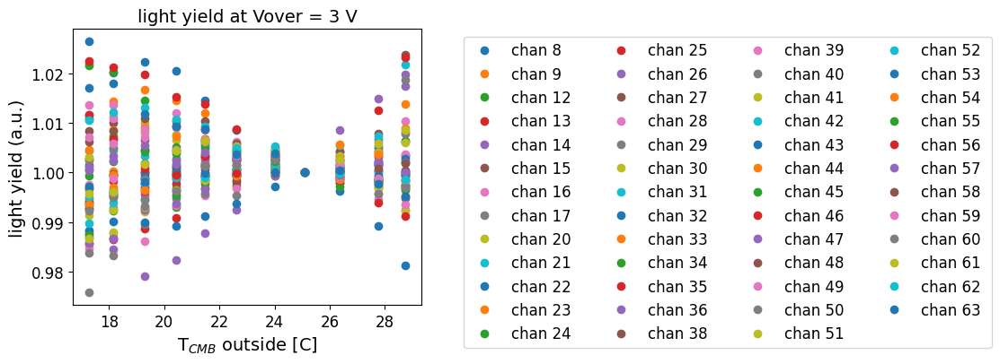

In [22]:
plt.figure(figsize = (5,4))
allchs = df_normalizationAt3VVover_templated['ch'].unique()
for chan in allchs:
    df_normalizationAt3VVover_templated_ = df_normalizationAt3VVover_templated.query('ch == %i'%chan).reset_index(drop=True)
    plt.plot(df_normalizationAt3VVover_templated_['tempLED'], df_normalizationAt3VVover_templated_['PEsat3V_normalized'],
             'o', label='chan %i '%chan)
plt.title("light yield at Vover = 3 V")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', ncol = 4, bbox_to_anchor=(1.10, 1.0))
plt.show()

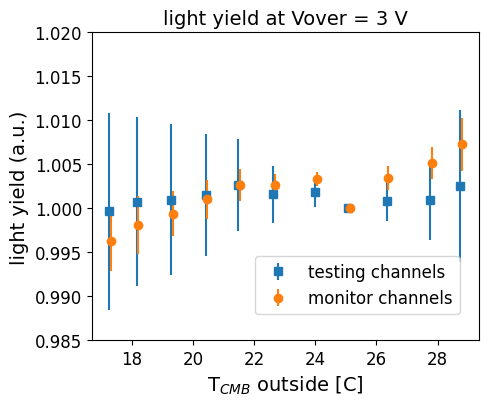

In [23]:
plt.figure(figsize = (5,4))
lightYield = []
lightYieldRms = []
for tTempLED in tempLEDs:
    df_normalizationAt3VVover_templated_ = df_normalizationAt3VVover_templated.query('tempLED == %f'%tTempLED).reset_index(drop=True)
    lightYield.append(np.mean(df_normalizationAt3VVover_templated_['PEsat3V_normalized'].astype(float)))
    lightYieldRms.append(np.std(df_normalizationAt3VVover_templated_['PEsat3V_normalized'].astype(float)))
plt.errorbar(tempLEDs, np.array(lightYield), np.array(lightYieldRms), marker='s', linestyle='none', label = 'testing channels')
plt.errorbar(tempLEDs+0.05, np.array(lightYield_monitor), np.array(lightYieldRms_monitor), marker='o', linestyle='none', label = 'monitor channels')
plt.title("light yield at Vover = 3 V")
plt.xlabel("T$_{CMB}$ outside [C]")
plt.ylabel("light yield (a.u.)")
plt.legend(loc='upper left', bbox_to_anchor=(0.4, 0.3))
plt.gca().set_ylim(0.985, 1.020)
plt.show()

## This looks even better and there is an agreement below 0.5%. Again, recall the result from the monitor channels did not use the light yield - Vover correction relation of the specific channels. The ones coming from the test channels still have relatively large spread

## The above shows light yield not statistically significantly different from constant LED light emission. Using the (1.21$\pm$0.10)%/K we obtained, the new p5 would be (21.8$\pm$2.1)%/K, compared to the original (22.9$\pm$1.8)%/K.

## With a 10 degC temperature difference, the correction would be on the 10% level. The 0.5% difference from the LED is neglegible.

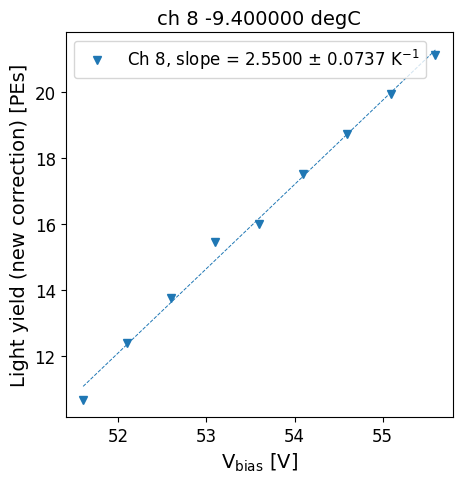

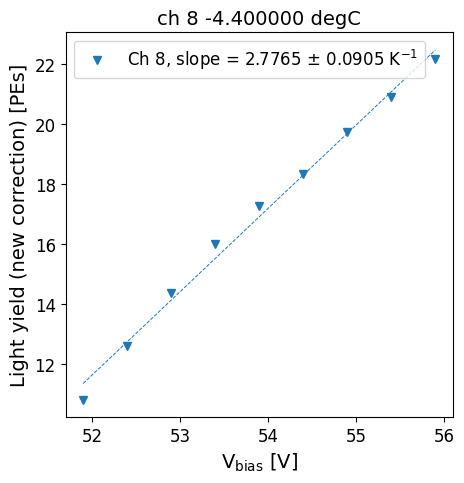

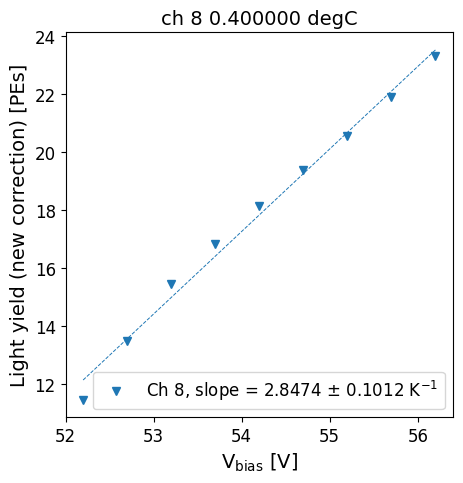

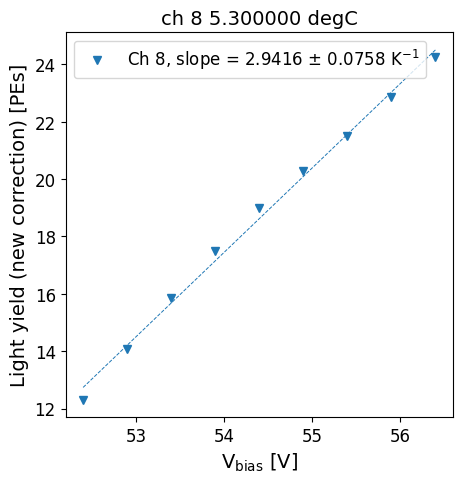

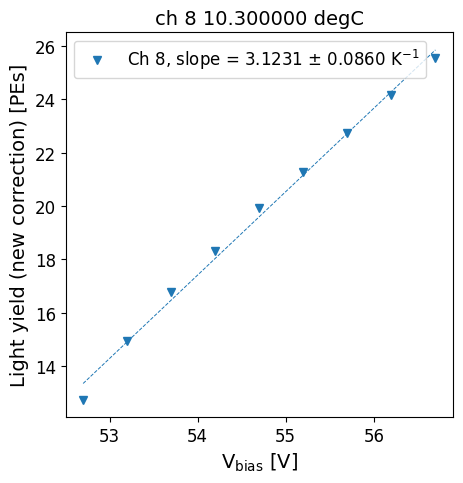

...

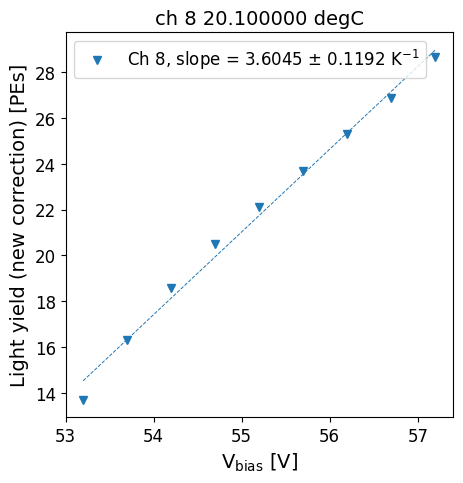

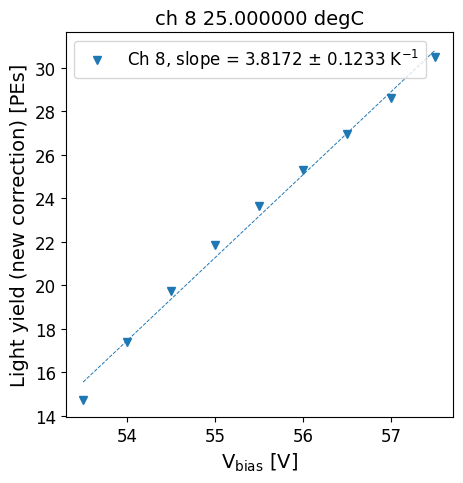

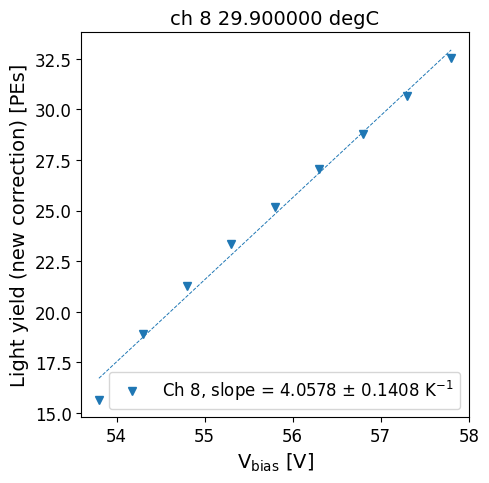

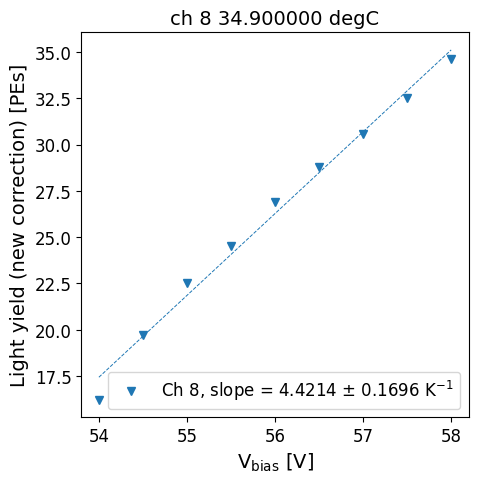

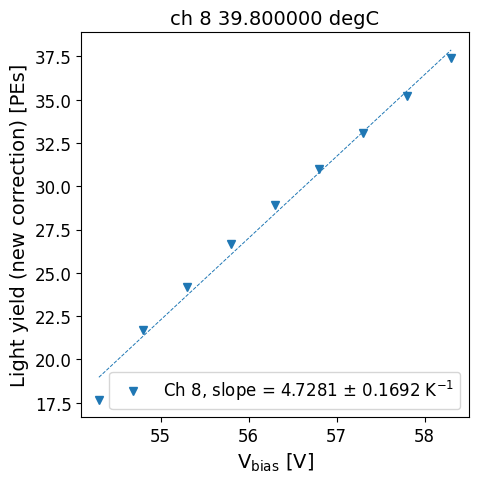

In [24]:
df_008_PE_new_value = pd.DataFrame(columns=['chan', 'tempSensor', 'pe_54V_fix_adj_new_coeff', 'pe_54V_fix_adj_new_coeff_with_LED'])
ref_cmb_temp = 20.0

for i in range(16):
    if i<2:
        continue
    for ichan in range(4):
        chan = 4*i+ichan
        if chan in bad_channels:
            continue            
        for tTemp in tempSensors:
            df_ = df_scan.query("ch==%i & tempSensor==%f"%(chan, tTemp)).reset_index()
            xx = df_['VppN'].astype(float)
            zz = df_['PEsCorrected'].astype(float)
            CMBtemp = df_['CMBtemp'].astype(float)
            mask1 = zz>1
            xx1=xx[mask1]
            zz=zz[mask1]
            CMBtemp=CMBtemp[mask1]
    
            for ii in range(len(zz)):
                dVover = -0.0554*(CMBtemp[ii]-ref_cmb_temp)
                zz[ii] = zz[ii]*(1+0.229*dVover)/(1+0.218*dVover)
            
            if zz.size==0 :
                print("Bad channel: %d at set temp %.0f C"%(chan, tTemp))
                continue
            
            popt1, pcov1 = curve_fit(lin_func, xx1.astype(float), zz.astype(float))
            slope1 = popt1[0]
            intercept1 = popt1[1]
            std_err1 = np.sqrt(pcov1[0,0])
            intercept_stderr1 = np.sqrt(pcov1[1,1])

            if chan == 8:
                fig, ax = plt.subplots(figsize=(5, 5))
                ax.set_title("ch %i %f degC"%(chan, tTemp))
                ax.set_xlabel('V$_{\mathrm{bias}}$ [V]')
                ax.set_ylabel('Light yield (new correction) [PEs]')
            
                scatter = ax.plot(xx1, zz, markers[ichan], label='Ch %i, slope = %.4f $\pm$ %.4f K$^{-1}$'%(chan, slope1, std_err1))
                ax.plot(xx1, slope1 * xx1 + intercept1, '--', color = scatter[0].get_color(), linewidth=0.7)
                #ax.set_ylim([0.8, 1.3])
                ax.legend()
                
            if slope == 0 or intercept == 0:
                print(chan, "slope:", slope, "intercept", intercept, "\n", xx, yy)
    
            new_row = {'chan':chan, 
                       'tempSensor':tTemp,
                       'pe_54V_fix_adj_new_coeff': 54*slope1+intercept1,
                       'pe_54V_fix_adj_new_coeff_with_LED': (54*slope1+intercept1)/lightYield[tempSensors.tolist().index(tTemp)]}
                       
            df_008_PE_new_value.loc[len(df_008_PE_new_value)] = new_row

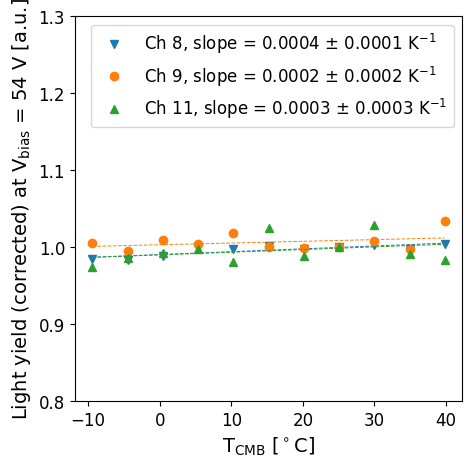

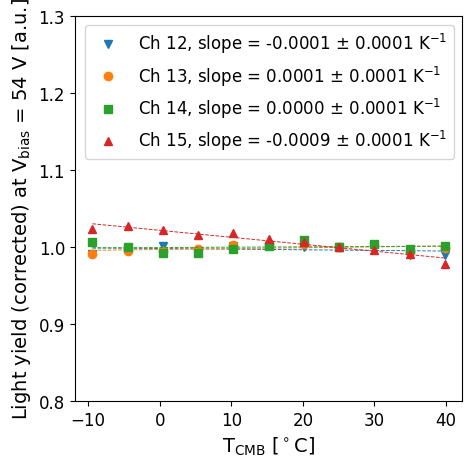

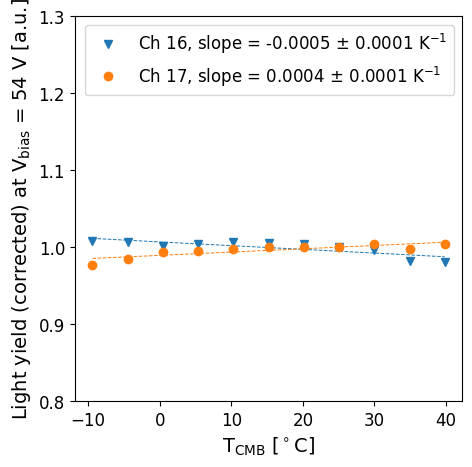

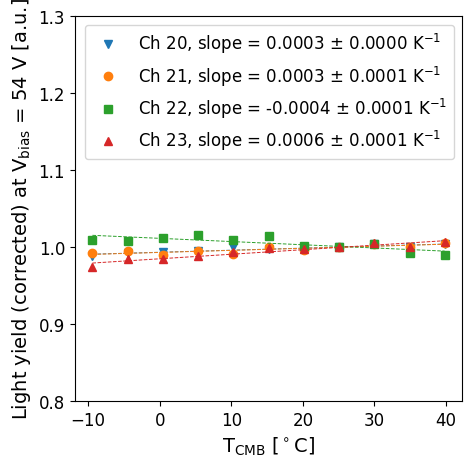

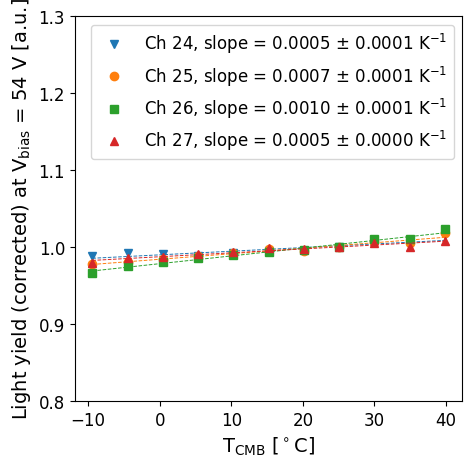

...

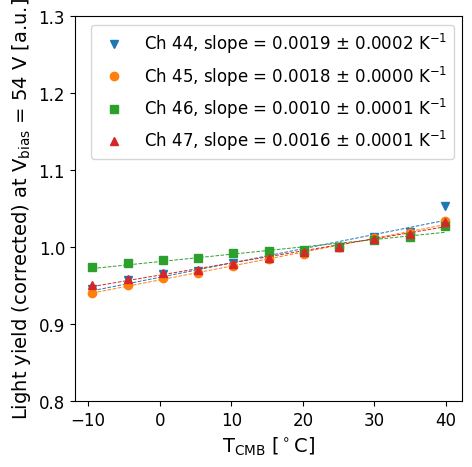

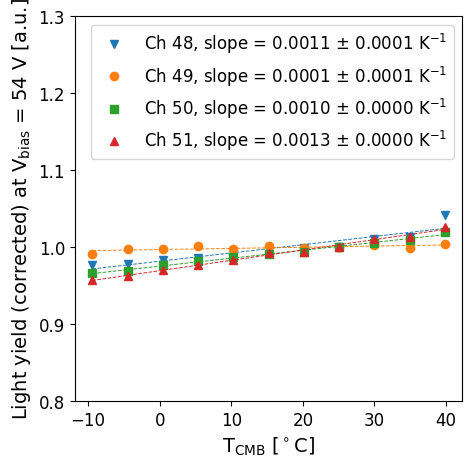

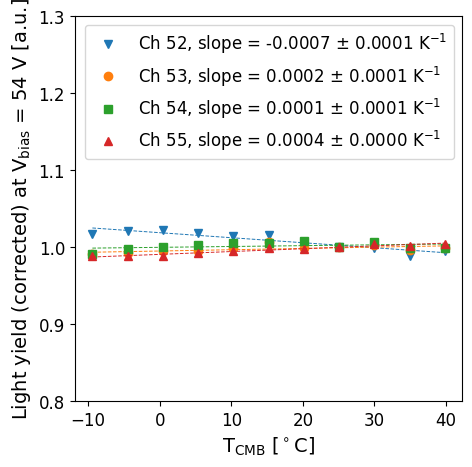

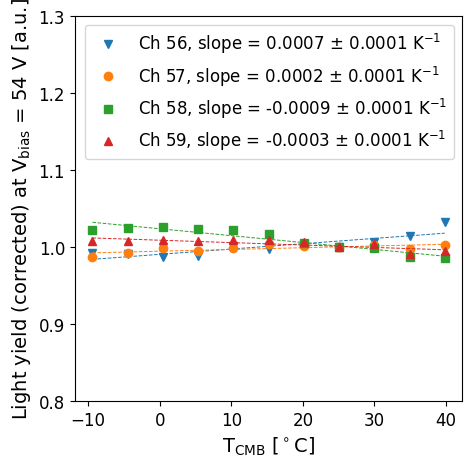

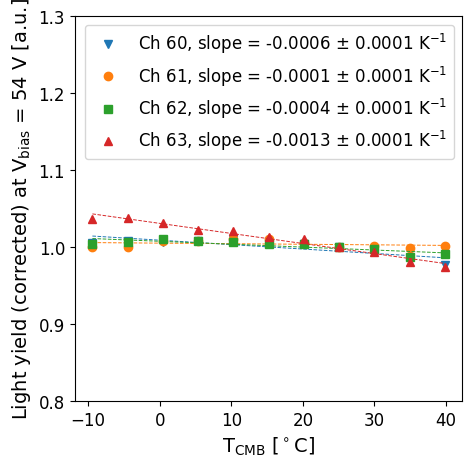

In [25]:
new_slope_list_1 = []

for i in range(16):
    if i<2:
        continue
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
    ax.set_ylabel('Light yield (corrected) at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
    start_chan = 4*i
    for chan in range(4):
        if chan+start_chan in bad_channels:
            continue
        df_ = df_008_PE_new_value.query("chan==%i"%(chan+start_chan)).reset_index()
        x = df_['tempSensor']
        y = df_['pe_54V_fix_adj_new_coeff'].to_numpy()
        y = y/y[7]
        # print(chan+start_chan, y)
                   
        mask1 = ~np.isnan(y)
        mask2 = (y!=0)
        mask = mask1 & mask2
        x=x[mask]
        y=y[mask]
    
        popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
        slope = popt[0]
        intercept = popt[1]
        std_err = np.sqrt(pcov[0,0])
        intercept_stderr = np.sqrt(pcov[1,1])
        
        new_slope_list_1.append(slope)
        
        scatter = ax.plot(x, y, markers[chan], label='Ch %i, slope = %.4f $\pm$ %.4f K$^{-1}$'%(chan+start_chan, slope, std_err))
        ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
        ax.set_ylim([0.8, 1.3])
        ax.legend()

Text(0, 0.5, 'Count')

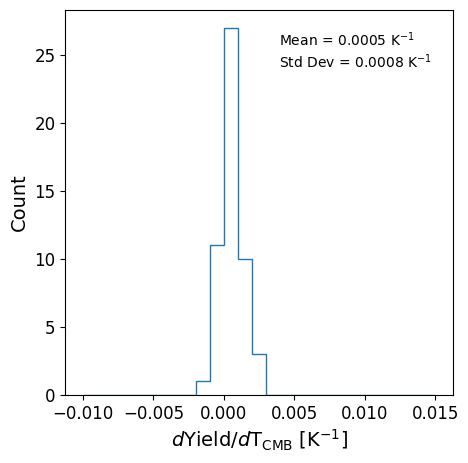

In [26]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.hist(new_slope_list_1, bins=[-0.010+0.001*i for i in range(26)], histtype='step')
ax.text(0.55, 0.85, 'Mean = %.4f K$^{-1}$'%(np.mean(new_slope_list_1))+'\n'+'Std Dev = %.4f K$^{-1}$'%(np.std(new_slope_list_1)), fontsize = 10, transform=ax.transAxes)
ax.set_xlabel('$d$Yield/$d$T$_{\mathrm{CMB}}$ [K$^{-1}$]')
ax.set_ylabel('Count')

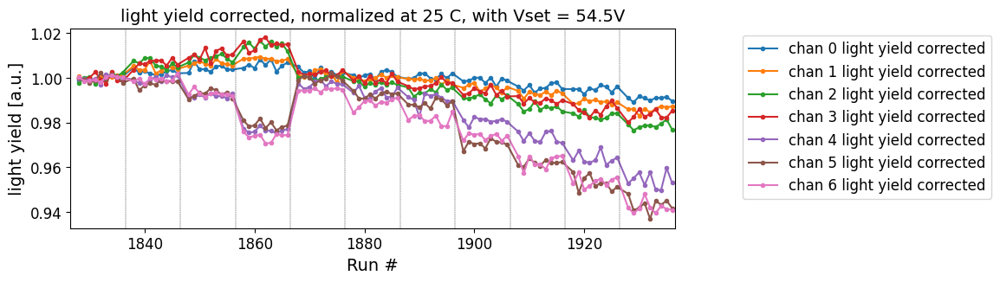

In [27]:
ref_cmb_temp = 20.0

plt.figure(figsize = (9,3))
for chan in range(8):
    if chan in bad_channels:
        continue
    df_ = df.query('ch == %i'%chan).reset_index(drop=True)
    xx = df_['run']
    yy = df_['PEsCorrected'].astype(float)
    CMBtemp = df_['CMBtemp'].astype(float)
    for ii in range(len(yy)):
        dVover = -0.0554*(CMBtemp[ii]-ref_cmb_temp)
        yy[ii] = yy[ii]*(1+0.229*dVover)/(1+0.218*dVover)
    dVover25degC = -0.0554*(25.0-ref_cmb_temp)
    correction25degC = (1+0.229*dVover25degC)/(1+0.218*dVover25degC)
    norm_factor =  np.mean(df_.query('CMBtemp > 24 and CMBtemp < 26').reset_index(drop=True)['PEsCorrected'])*correction25degC
    plt.plot(xx, yy/norm_factor,'.-',
             label='chan %i light yield corrected'%chan)
plt.title("light yield corrected, normalized at 25 C, with Vset = 54.5V")
plt.xlabel("Run #")
plt.ylabel("light yield [a.u.]")
plt.gca().set_xlim(np.min(runs)-1.5, np.max(runs)+0.5)
plt.legend(loc='upper left', bbox_to_anchor=(1.10, 1.0))
for iTemp in range(11):
    plt.axvline(x=np.min(runs)+10*iTemp-1.5, color='k', linestyle='--', linewidth=0.3)
plt.show()

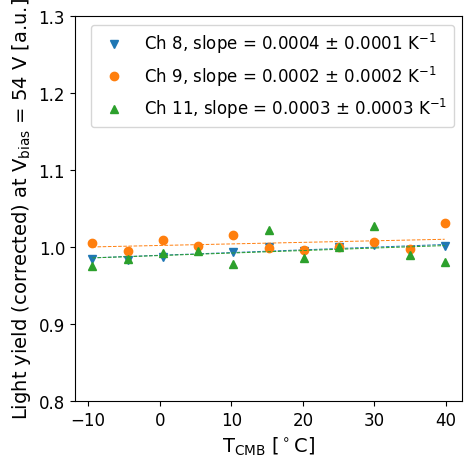

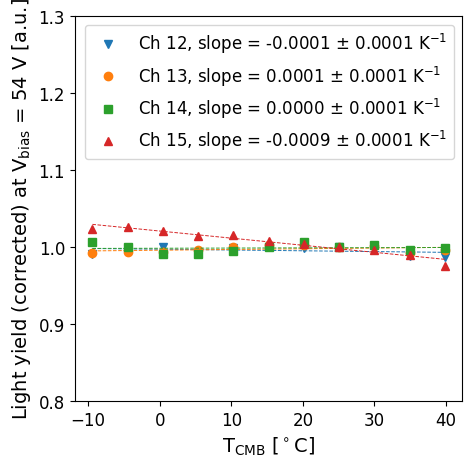

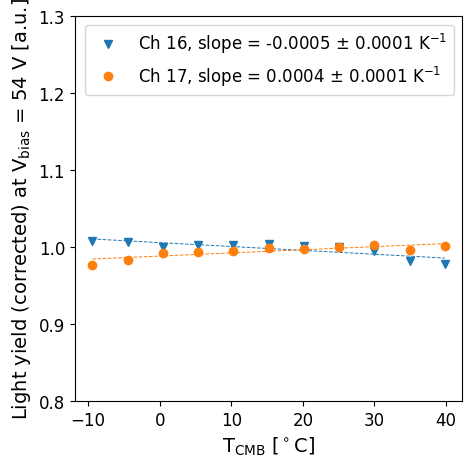

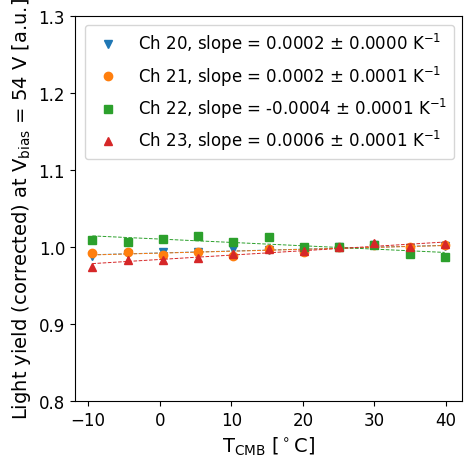

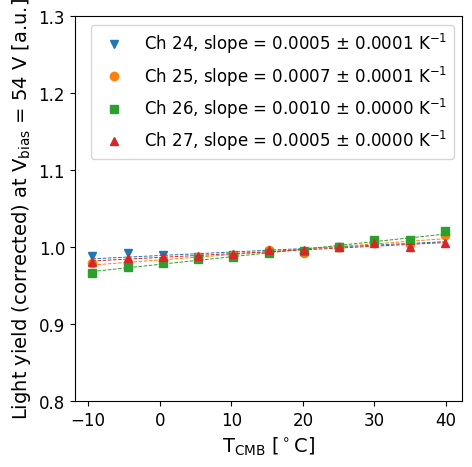

...

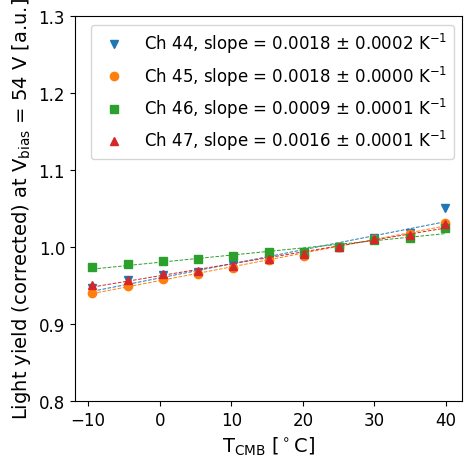

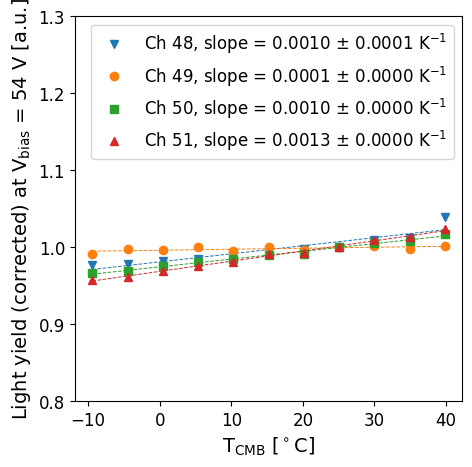

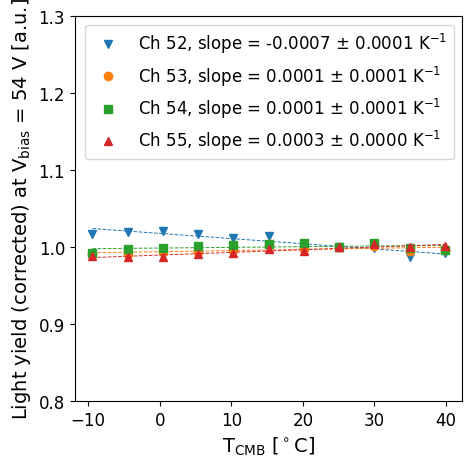

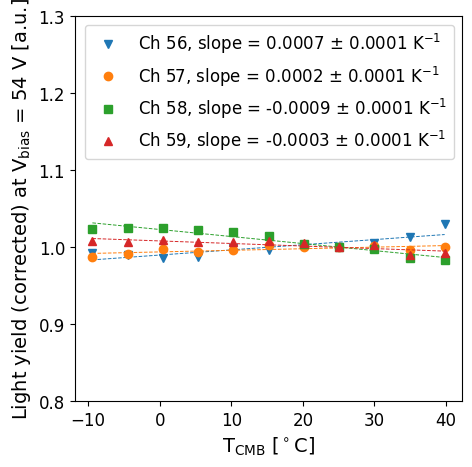

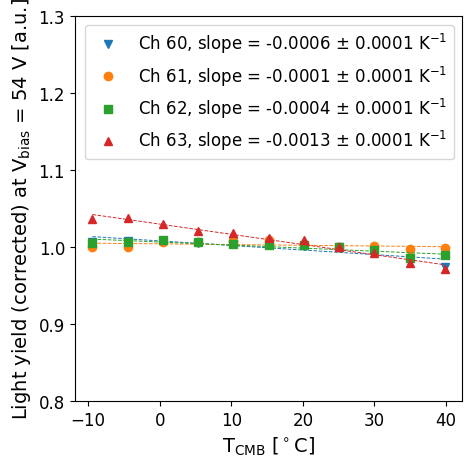

In [28]:
new_slope_list_2 = []

for i in range(16):
    if i<2:
        continue
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
    ax.set_ylabel('Light yield (corrected) at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
    start_chan = 4*i
    for chan in range(4):
        if chan+start_chan in bad_channels:
            continue
        df_ = df_008_PE_new_value.query("chan==%i"%(chan+start_chan)).reset_index()
        x = df_['tempSensor']
        y = df_['pe_54V_fix_adj_new_coeff_with_LED'].to_numpy()
        y = y/y[7]
        # print(chan+start_chan, y)
                   
        mask1 = ~np.isnan(y)
        mask2 = (y!=0)
        mask = mask1 & mask2
        x=x[mask]
        y=y[mask]
    
        popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
        slope = popt[0]
        intercept = popt[1]
        std_err = np.sqrt(pcov[0,0])
        intercept_stderr = np.sqrt(pcov[1,1])
        
        new_slope_list_2.append(slope)
        
        scatter = ax.plot(x, y, markers[chan], label='Ch %i, slope = %.4f $\pm$ %.4f K$^{-1}$'%(chan+start_chan, slope, std_err))
        ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
        ax.set_ylim([0.8, 1.3])
        ax.legend()

Text(0, 0.5, 'Count')

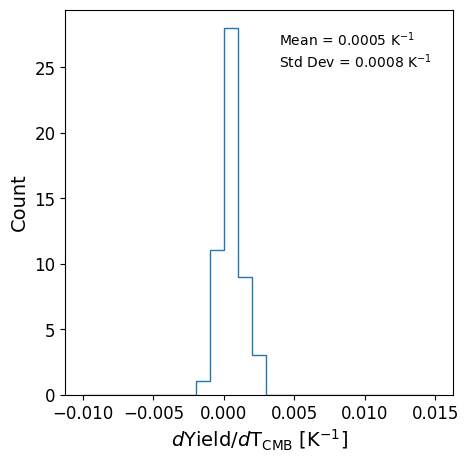

In [29]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.hist(new_slope_list_2, bins=[-0.010+0.001*i for i in range(26)], histtype='step')
ax.text(0.55, 0.85, 'Mean = %.4f K$^{-1}$'%(np.mean(new_slope_list_2))+'\n'+'Std Dev = %.4f K$^{-1}$'%(np.std(new_slope_list_2)), fontsize = 10, transform=ax.transAxes)
ax.set_xlabel('$d$Yield/$d$T$_{\mathrm{CMB}}$ [K$^{-1}$]')
ax.set_ylabel('Count')

# Now replotting the paper plots

In [43]:
plot_dir = os.path.join(topdir,"paper_plots")
start_chan = 52

Chan: 52, PE = -577.9+11.6V
Chan: 53, PE = -501.4+10.1V
Chan: 54, PE = -475.5+9.6V
Chan: 55, PE = -452.7+9.2V


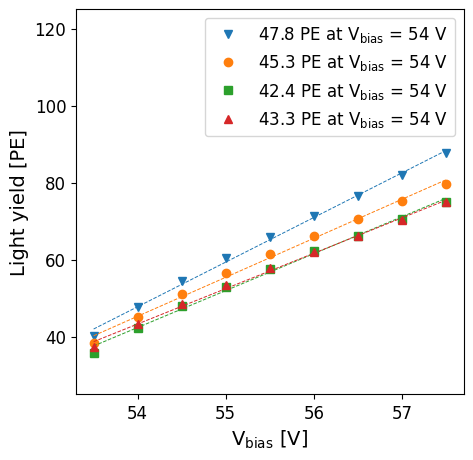

In [44]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlabel('V$_{\mathrm{bias}}$ [V]')
ax.set_ylabel('Light yield [PE]')
for chan in range(4):
    df_ = df_scan.query("ch==%i & tempSensor==25.0"%(start_chan+chan)).reset_index()
    x = df_['VppN']
    y = df_['PEs']
                
    mask1 = ~np.isnan(y)
    mask2 = (y!=0)
    mask = mask1 & mask2
    x=x[mask]
    y=y[mask]
    slope, intercept, r_value, p_value, std_err = stats.linregress(x.astype(float), y.astype(float))
    vbd = -intercept/slope
    PE_54V = slope*54+intercept
    
    # scatter = ax.plot(x, y, markers[chan], label='Slope = %.1f PE/V, %.1f PE @ V$_{\mathrm{bias}}$ = 54 V'%(slope, PE_54V))
    scatter = ax.plot(x, y, markers[chan], label='%.1f PE at V$_{\mathrm{bias}}$ = 54 V'%(PE_54V))
    ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
    ax.set_ylim([25, 125])

    print ('Chan: %d, PE = %.1f+%.1fV'%(start_chan+chan, intercept, slope))
 
plt.legend()
plt.show()
fig.savefig(os.path.join(plot_dir,"PE_vs_bias_scan2.pdf"), bbox_inches='tight')

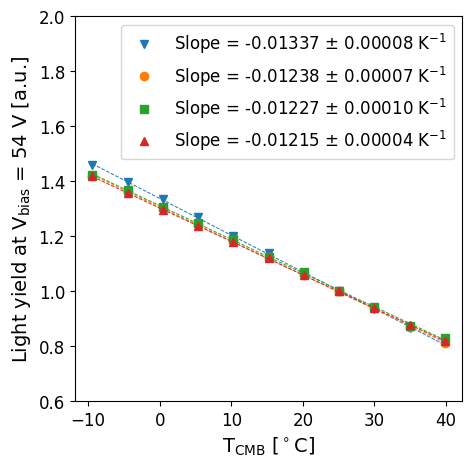

In [45]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
ax.set_ylabel('Light yield at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
for chan in range(4):
    df_ = df_008_PE.query("chan==%i"%(chan+start_chan)).reset_index()
    x = df_['tempSensor']
    y = df_['pe_54V_fix'].to_numpy()
    y = y/y[7]
                
    mask1 = ~np.isnan(y)
    mask2 = (y!=0)
    mask = mask1 & mask2
    x=x[mask]
    y=y[mask]

    popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
    slope = popt[0]
    intercept = popt[1]
    std_err = np.sqrt(pcov[0,0])
    intercept_stderr = np.sqrt(pcov[1,1])
    
    scatter = ax.plot(x, y, markers[chan], label='Slope = %.5f $\pm$ %.5f K$^{-1}$'%(slope, std_err))
    ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
    ax.set_ylim([0.6, 2])
    ax.legend()

fig.savefig(os.path.join(plot_dir,"PE_vs_temp_54V_scan2.pdf"), bbox_inches='tight')

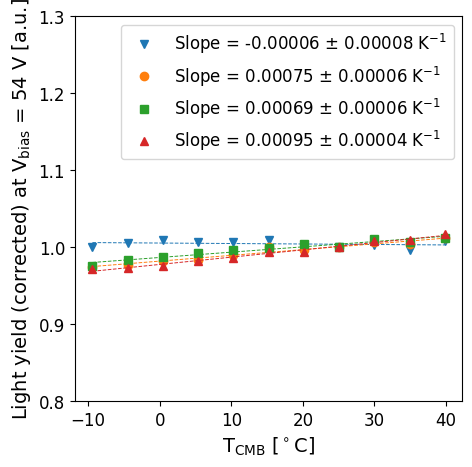

In [46]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
ax.set_ylabel('Light yield (corrected) at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
for chan in range(4):
    df_ = df_008_PE.query("chan==%i"%(chan+start_chan)).reset_index()
    x = df_['tempSensor']
    y = df_['pe_54V_fix_adj'].to_numpy()
    y = y/y[7]
                
    mask1 = ~np.isnan(y)
    mask2 = (y!=0)
    mask = mask1 & mask2
    x=x[mask]
    y=y[mask]

    popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
    slope = popt[0]
    intercept = popt[1]
    std_err = np.sqrt(pcov[0,0])
    intercept_stderr = np.sqrt(pcov[1,1])
    
    scatter = ax.plot(x, y, markers[chan], label='Slope = %.5f $\pm$ %.5f K$^{-1}$'%(slope, std_err))
    ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
    ax.set_ylim([0.8, 1.3])
    ax.legend()
    
fig.savefig(os.path.join(plot_dir,"PE_corr_vs_temp_008_scan2.pdf"), bbox_inches='tight')

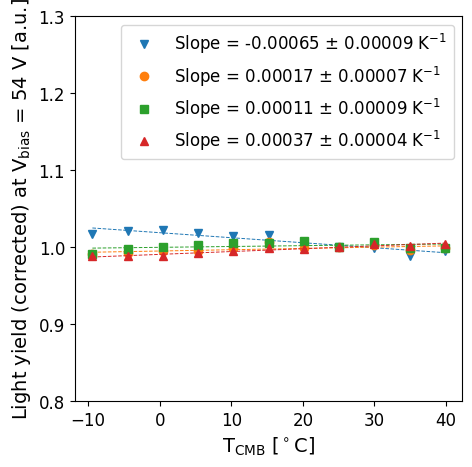

In [47]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlabel('T$_{\mathrm{CMB}}$ [$^\circ\mathrm{C}$]')
ax.set_ylabel('Light yield (corrected) at V$_{\mathrm{bias}}$ = 54 V [a.u.]')
for chan in range(4):
    df_ = df_008_PE_new_value.query("chan==%i"%(chan+start_chan)).reset_index()
    x = df_['tempSensor']
    y = df_['pe_54V_fix_adj_new_coeff'].to_numpy()
    y = y/y[7]
                
    mask1 = ~np.isnan(y)
    mask2 = (y!=0)
    mask = mask1 & mask2
    x=x[mask]
    y=y[mask]

    popt, pcov = curve_fit(lin_func, x.astype(float), y.astype(float))
    slope = popt[0]
    intercept = popt[1]
    std_err = np.sqrt(pcov[0,0])
    intercept_stderr = np.sqrt(pcov[1,1])
    
    scatter = ax.plot(x, y, markers[chan], label='Slope = %.5f $\pm$ %.5f K$^{-1}$'%(slope, std_err))
    ax.plot(x, slope * x + intercept, '--', color = scatter[0].get_color(), linewidth=0.7)
    ax.set_ylim([0.8, 1.3])
    ax.legend()
    
fig.savefig(os.path.join(plot_dir,"PE_corr_vs_temp_008_scan2_newp5.pdf"), bbox_inches='tight')